<a href="https://colab.research.google.com/github/arpanbiswas52/varTBO/blob/main/BO(image_patch)_spectral_MicroscopyVersion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **BO Spectral**
Dec, 2022

This is modified BO recommder system framework for connect with microscope

## *   Rama Vasudevan proposed the idea
## *   Arpan Biswas developed dKLBO recommder system framework
## *   Rama Vasudevan, Yongtao Liu adapted to make it compatible with microscopy measurement



#Problem Description
Build a BO framework-

Here we have a image data, where X is the input location of the image

Each location in the image, we have a spectral data, from where user select if the data is good/bad (discrete choice). We take the means of all good spectral only to generate the target spectral.

At the mid of execution, the user also have option to either eliminate (or update the preferance) all the previously stored (if user suddenly find a desired spectral) spectral, and put more weights on new found spectral.

The goal is to build a optimization (BO) model where we adaptively sample towards region (in image) of good spectral, and find optimal location point closest to the current chosen target spectral (as per user voting).

#Workflow: Run BO to find the optimal location for user-desired spectral as per voting
Here we vote the quality of spectral

User interaction part:

During the play (for each function evaluation)-

- View spectral image. User have three rating options as 0, 1, 2: 0-Bad, 1-Good, 2-Very good. **To answer 0-Bad spectral, user can just jit ENTER to save time**

- If user rated as Good or Very Good, and user already have a current target spectral (user already selected at least one good/very good spectral in earlier iterations), another message pops up if the user want to update preference of new spectral Vs the current target spectral(Y or N). **To answer No, user can just jit ENTER to save time**

  - If user choose "Y", user have option (any number between 0-10) to provide weights of new spectral. For example: If user provide 10 as input, the updated target spectral will be only the new chosen spectral and all the other earlier selected good spectral will be eliminated from target.

  - If user choose "N", as default the updated target spectral is the mean of all the earlier selected spectral and the new spectral.

- User will get prompt at each BO iteration if they are satisfied with current target spectral or need further updating(Y or N). **To answer No, user can just jit ENTER to save time**

  - If user select Y, target spectral will be updated as per voting of new spectral and **human-guided dynamic objective evaluation** will be conducted

  - If user select N, target spectral will be fixed and an **automated objective evaluation** will be conducted for future BO iteration (like normal BO and no further prompt of target updating)


After END OF PLAY, the code automatically save below data (serially) in optim.results.npy

- Best locations, from evaluated samples and GP estimated

- User rating of spectral at each evaluated locations in image

- the matrices of evaluated location and the respective obj values

In [1]:
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [2]:
!pip install --upgrade torch==1.8.1 torchvision==0.9.1
!pip install gpytorch botorch
!pip install smt
!pip install atomai
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 804.1 MB 5.8 kB/s 
     |████████████████████████████████| 17.4 MB 73.2 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.13.0+cu116
    Uninstalling torch-1.13.0+cu116:
      Successfully uninstalled torch-1.13.0+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.0+cu116
    Uninstalling torchvision-0.14.0+cu116:
      Successfully uninstalled torchvision-0.14.0+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.0 requires torch==1.13.0, but you have torch 1.8.1 which is incompatible.
torchaudio 0.13.0+cu116 requires torch==1.13.0, but you have torch 1.8.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-pytho

In [3]:
import sys
import gdown
import torch
from torchvision import datasets, transforms
from torchmetrics.functional import structural_similarity_index_measure as ssim2
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import numpy as np
import random
#import kornia as K
#import kornia.metrics as metrics
from PIL import Image
from typing import Tuple
import ipywidgets as widgets
from IPython.display import display
import pylab as pl
from IPython.display import clear_output
import pdb
from skimage.transform import resize
from mpl_toolkits.axes_grid1 import make_axes_locatable
#import gpim
from sklearn.decomposition import PCA
import matplotlib.gridspec as gridspec
from copy import deepcopy

from typing import Union
import pickle

# Import GP and BoTorch functions
import gpytorch as gpt
from botorch.models import SingleTaskGP, ModelListGP
#from botorch.models import gpytorch
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel, MaternKernel, PeriodicKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from botorch.acquisition import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from botorch.sampling import SobolQMCNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan

from botorch.generation import get_best_candidates, gen_candidates_torch
from botorch.optim import gen_batch_initial_conditions

from gpytorch.models import ExactGP
from mpl_toolkits.axes_grid1 import make_axes_locatable
from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
from scipy.interpolate import interp1d
from skimage.metrics import structural_similarity as ssim
from skimage import filters
from skimage.restoration import denoise_bilateral
import atomai as aoi
from atomai import utils

import time

In [4]:
class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        #self.mean_module = LinearMean(train_X.shape[-1])
        self.covar_module = ScaleKernel(
            #base_kernel=MaternKernel(nu=2.5, ard_num_dims=train_X.shape[-1]),
            #base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
            base_kernel=PeriodicKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

In [5]:
class play_varTBO():

    def __init__(self):
      pass

    @classmethod
    def func_automated_obj(self, idx_x, idx_y, new_spec_x, new_spec_y, target_func):
        idx1 = int(idx_x)
        idx2 = int(idx_y)
        rf = 10
        #print(wcount_good)
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = torch.rand(1)*(1) # Unif[0, 1] A sufficiently large value as we want to avoid selecting bad loops,


        else:
            #Calculate ssim between target and ith loop shape
            pred = new_spec_y.detach().numpy()
            target = target_func.detach().numpy()
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = rf * ssim_spec  #Maximize reward and negative mse
        #print(obj)
        return obj

    @classmethod
    def func_human_interacted_obj(self, idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, vote):
        idx1 = int(idx_x)
        idx2 = int(idx_y)
        rf = 1
        #print(wcount_good)
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = torch.rand(1)*(1) # Unif[0, 1] A sufficiently large value as we want to avoid selecting bad loops,
            # When we have a target, we will recalculate again to get more accuract estimate
            R = vote*rf

        else:
            #Calculate dissimilarity (mse) between target and ith loop shape

            pred = new_spec_y.detach().numpy()
            target = target_func.detach().numpy()
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())
            #plt.plot(new_spec_x, new_spec_y)
            #plt.show()
            #dev2_spectral = (target_func-new_spec_y)**2
            #mse_spectral = torch.mean(dev2_spectral)
            #Calculate reward as per voting, this will minimize the risk of similar function values of good and bad loop shape with similar mse
            R = vote*rf

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = R + ssim_spec #Maximize reward and ssim
        #print(mse_spectral)
        return obj

    @classmethod
    def optimize_hyperparam_trainGP(self, train_X, train_Y):
        # Gp model fit

        gp_surro = SimpleCustomGP(train_X, train_Y)
        gp_surro = gp_surro.double()
        gp_surro.likelihood.noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
        mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood, gp_surro)
        # fit_gpytorch_model(mll)
        mll1 = mll1.to(train_X)
        gp_surro.train()
        gp_surro.likelihood.train()
        ## Here we use Adam optimizer with learning rate =0.1, user can change here with different algorithm and/or learning rate for each GP
        optimizer1 = Adam([{'params': gp_surro.parameters()}], lr=0.1) #0.01 set for BEPFM data, recommended to check the lr for any new data
        #optimizer1 = SGD([{'params': gp_surro.parameters()}], lr=0.0001)

        NUM_EPOCHS = 150

        for epoch in range(NUM_EPOCHS):
            # clear gradients
            optimizer1.zero_grad()
            # forward pass through the model to obtain the output MultivariateNormal
            output1 = gp_surro(train_X)
            # Compute negative marginal log likelihood
            loss1 = - mll1(output1, gp_surro.train_targets)
            # back prop gradients
            loss1.backward(retain_graph=True)
            # print last iterations
            if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
                print("GP Model trained:")
                print("Iteration:" + str(epoch + 1))
                print("Loss:" + str(loss1.item()))
                # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
                print("noise:" + str(gp_surro.likelihood.noise.item()))

            optimizer1.step()

        gp_surro.eval()
        gp_surro.likelihood.eval()
        return gp_surro

    @classmethod
    def cal_posterior(self, gp_surro, test_X):
        y_pred_means = torch.empty(len(test_X), 1)
        y_pred_vars = torch.empty(len(test_X), 1)
        t_X = torch.empty(1, test_X.shape[1])
        #print(t_X)
        for t in range(0, len(test_X)):
            with torch.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
                gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False,
                                                          solves=True), \
                gpt.settings.max_cg_iterations(100), \
                gpt.settings.max_preconditioner_size(80), \
                gpt.settings.num_trace_samples(128):

                    t_X[0, :] = test_X_norm[t, :]
                    #t_X[:, 1] = test_X[t, 1]
                    #t_X = test_X.double()
                    y_pred_surro = gp_surro.posterior(t_X)
                    y_pred_means[t, 0] = y_pred_surro.mean
                    y_pred_vars[t, 0] = y_pred_surro.variance

        return y_pred_means, y_pred_vars
    
    @classmethod
    def acqmanEI(self, y_means, y_vars, train_Y, ieval):
        y_means = y_means.detach().numpy()
        y_vars = y_vars.detach().numpy()
        y_std = np.sqrt(y_vars)
        fmax = train_Y.max()
        fmax = fmax.detach().numpy()
        best_value = fmax
        EI_val = np.zeros(len(y_vars))
        Z = np.zeros(len(y_vars))
        eta = 0.01

        for i in range(0, len(y_std)):
            if (y_std[i] <=0):
                EI_val[i] = 0
            else:
                Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
                EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])

        # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
        EI_val[ieval] = -1
        acq_val = np.max(EI_val)
        acq_cand = [k for k, j in enumerate(EI_val) if j == acq_val]
        #print(acq_val)
        return acq_cand, acq_val, EI_val

    @classmethod
    def augment_newdata_KL(self, acq_X, acq_X_norm, acq_indices, train_X, train_X_norm, train_indices, train_Y, 
                           new_spec_x, new_spec_y, eval_spec, img_space, var_params, u, m):
        wcount_good, pref, target_func = var_params[0], var_params[1], var_params[2]

        nextX = acq_X
        nextX_norm = acq_X_norm
        nextind = acq_indices
        train_X_norm = torch.vstack((train_X_norm, nextX_norm))
        train_X = torch.vstack((train_X, nextX))
        train_indices = torch.vstack((train_indices, nextind))

        p = torch.empty(1, 1)
        #x = torch.empty((1,2))
        idx_x = int(train_indices[-1, 0])
        idx_y = int(train_indices[-1, 1])

        
        if (u == 0):
            print("Are you satisfied with current target? (y- yes or press ENTER- No)")
            update_target = str(input("Answer: "))
            if (update_target == "Y" or update_target == 'y'):
                print("Spectral target now fixed. Continue automated BO...")
                #First time switching to automated BO, need to recalculate the objectives again
                plt.plot(new_spec_x, new_spec_y)
                plt.title('loc:' +str(idx_y) +"," + str(idx_x), fontsize = 20)
                plt.show()
                train_Y = torch.empty((train_X.shape[0], 1))
                u = 1 # This is a switching parameter to not call for update target every iteration once the user is satisfied
                for i in range(0, train_X.shape[0]):
                    idx_x = int(train_indices[i, 0])
                    idx_y = int(train_indices[i, 1])
                    spec_y = eval_spec_y[idx_x, idx_y, :]
                    #print(idx_x, idx_y, spec_y)
                    train_Y[i, 0] = self.func_automated_obj(idx_x, idx_y, new_spec_x, spec_y, target_func)
  
            else:
                print("User still searching for best target. Continue BO with human interaction...")

                #Vote for new spectral sample and update(or not) target spectral function
                p[0, 0], wcount_good, target_func = self.generate_targetobj(idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func)
                pref = torch.vstack((pref, p)) #Augment pref matrix

                if (p[0, 0] == 0):
                  # If target loop is not updated, we eval for the new samples only as the
                  # func value for others remain the same

                    next_feval = torch.empty(1, 1)
                    next_feval[0, 0] = self.func_human_interacted_obj(idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, pref[-1, 0])
                    train_Y = torch.vstack((train_Y, next_feval))
                else:
                    # If target loop is updated, we reevaluate the obj of old spectral samples and 
                    # eval for the new samples
                    train_Y = torch.empty((train_X.shape[0], 1))
                    for i in range(0, train_X.shape[0]):
                        #x[0, 0] = train_X[i, 0]
                        #x[0, 1] = train_X[i, 1]
                        idx_x = int(train_indices[i, 0])
                        idx_y = int(train_indices[i, 1])
                        spec_y = eval_spec_y[idx_x, idx_y, :]
                        #print(idx_x, idx_y, spec_y)
                        train_Y[i, 0] = self.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])
        else:
            plt.plot(new_spec_x, new_spec_y)
            plt.title('loc:' +str(idx_y) +"," + str(idx_x), fontsize = 20)
            plt.show()
            next_feval = torch.empty(1, 1)
            next_feval[0, 0] = self.func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func)
            train_Y = torch.vstack((train_Y, next_feval)) 

        var_params = [wcount_good, pref, target_func]
        m = m + 1
        return train_X, train_X_norm, train_indices, train_Y, var_params, u, m

    @classmethod
    def generate_targetobj(self, idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func):
      #count_good= 0
      idx1 = int(idx_x)
      idx2 = int(idx_y)
      if (wcount_good == 0):
        # Figure for user choice
        fig,ax=plt.subplots(ncols=2,figsize=(12,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx2) +"," + str(idx1), fontsize = 20)
        plt.show()

      else:
        # Figure for user choice
        fig,ax=plt.subplots(ncols=3,figsize=(18,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx2) +"," + str(idx1), fontsize = 20)
        ax[2].plot(new_spec_x,target_func)
        ax[2].set_title('Current target function', fontsize = 20)
        plt.show()

      print("Rating: 0-Bad or press ENTER, 1-Good, 2-Very good")
      time.sleep(0.5)
      vote = (input("enter rating: "))
      # For bad spectral, we can also input null values to accelerate the voting- This is similar to skipping voting for bad spectral
      #For good ones, user need to vote as either 1 or 2
      if (vote == ""):
        vote = 0
        print(vote)
      else:
        vote = float(vote)
        print(vote)

      if(vote>0):
        newspec_wt = 1
        if ((wcount_good) > 0): #Only if we already have selected good spectral in early iterations
          print("Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No")
          newspec_pref = str(input("Answer: "))
          # For no pref update, we can also press enter (skip) to accelerate the process
          if (newspec_pref == 'Y' or newspec_pref == 'y'):
            print("Provide weights between 0 and 10: \n10 being all the weights to new spectral as new target.")
            newspec_wt = float(input("enter weightage: "))/10
            print(newspec_wt)
          else:
            newspec_wt = 0.5
        wcount_good =wcount_good + vote
        target_func = (((1-newspec_wt)*target_func*(wcount_good-vote))+(newspec_wt*vote*new_spec_y))/(((
            wcount_good-vote)*(1-newspec_wt)) + (vote*newspec_wt))
      return vote, wcount_good, target_func    

    @classmethod
    def estimate (self, train_indices, train_Y, indices, y_pred_means):
        #Best solution among the evaluated data
        loss = torch.max(train_Y)
        ind = torch.argmax(train_Y)
        X_opt = torch.empty((1,2))
        X_opt[0, 0] = train_indices[ind, 0]
        X_opt[0, 1] = train_indices[ind, 1]
        #print(loss, ind)

        # Best estimated solution from GP model considering the non-evaluated solution
        loss = torch.max(y_pred_means)
        ind = torch.argmax(y_pred_means)
        X_opt_GP = torch.empty((1,2))
        X_opt_GP[0, 0] = indices[ind, 0]
        X_opt_GP[0, 1] = indices[ind, 1]
        #print(loss, ind)

        return X_opt, X_opt_GP


# Help function

In [6]:
def plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_opt, X_opt_GP, img_space, i):
  pen = 10**0
  #Objective map
  fig,ax=plt.subplots(ncols=3,figsize=(18,5))
  a= ax[0].imshow(img_space, origin = "lower")
  ax[0].scatter(train_indices[:,1], train_indices[:,0], c=train_Y, cmap='jet', linewidth=0.2)
  ax[0].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[0].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  ax[0].axes.xaxis.set_visible(False)
  ax[0].axes.yaxis.set_visible(False)

  a = ax[1].scatter(indices[:,1], indices[:,0], c=y_pred_means/pen, cmap='viridis', linewidth=0.2)
  ax[1].scatter(train_indices[:,1], train_indices[:,0], marker='o', c='g')
  ax[1].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[1].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  divider = make_axes_locatable(ax[1])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(a, cax=cax, orientation='vertical')
  ax[1].set_title('Objective (GP mean) map', fontsize=10)
  ax[1].axes.xaxis.set_visible(False)
  ax[1].axes.yaxis.set_visible(False)
  #ax[1].colorbar(a)

  b = ax[2].scatter(indices[:,1], indices[:,0], c=y_pred_vars/(pen**2), cmap='viridis', linewidth=0.2)
  divider = make_axes_locatable(ax[2])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(b, cax=cax, orientation='vertical')
  ax[2].set_title('Objective (GP var) map', fontsize=10)
  ax[2].axes.xaxis.set_visible(False)
  ax[2].axes.yaxis.set_visible(False)
  #ax[2].colorbar(b)

  plt.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
  plt.show()


#Load Dataset

In [ ]:
!gdown https://drive.google.com/uc?id=1By3GELJIYuco4lsPm_DsckZCYSzfKwi_
pickle_file_loc = r'beps_data_50x50.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']

Downloading...
From: https://drive.google.com/uc?id=1By3GELJIYuco4lsPm_DsckZCYSzfKwi_
To: /content/beps_data_50x50.p
100% 1.95G/1.95G [00:18<00:00, 105MB/s]


In [ ]:
spec_length = 64  #spectral data length

amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
img = amp_slices[:,16].reshape(50,50)

vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]

amp_mat = amp_slices[:,-128:][:,1::2]
amp_masked = np.zeros_like(amp_mat)


spec_length = amp_mat.shape[-1]  #spectral data length
specim = np.reshape(amp_mat, (img.shape[0], img.shape[1], spec_length))

print(img.shape, vdc_vec.shape, amp_slices.shape, specim.shape)

(50, 50) (64,) (2500, 256) (50, 50, 64)


In [ ]:
window_size = 4

coordinates = aoi.utils.get_coord_grid(img, step=1, return_dict=False)
features, targets, indices = aoi.utils.extract_patches_and_spectra(
    specim, img, coordinates=coordinates, window_size=window_size, avg_pool=1)

features.shape, targets.shape

((2209, 4, 4), (2209, 64))

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

In [ ]:
n, d1, d2 = features.shape
num_start = int(10)
N = int(100)
m = 0
spec_length = 64  #spectral data length



spec_length = amp_mat.shape[-1]  #spectral data length

coordinates = utils.get_coord_grid(img, 1)
X_feas = torch.from_numpy(features.reshape(n, d1*d2))

X_feas_norm = torch.from_numpy(features.reshape(n, d1*d2))

amp_masked = np.zeros_like(targets)
np.random.seed(10)

idx = np.random.randint(0, len(X_feas), num_start)
for ind in range(num_start):
    amp_masked[int(idx[ind]),:] = targets[int(idx[ind]),:]

train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]
indices = torch.from_numpy(indices)
train_indices = indices[idx]

print(X_feas.shape, X_feas_norm.shape,train_X.shape, train_X_norm.shape, train_indices.shape, amp_masked.shape)

torch.Size([2209, 16]) torch.Size([2209, 16]) torch.Size([10, 16]) torch.Size([10, 16]) torch.Size([10, 2]) (2209, 64)


# Initial evaluation

#Goal: Voting based on existance and higher prominance of left ear of spectral loop

i is 0, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #1


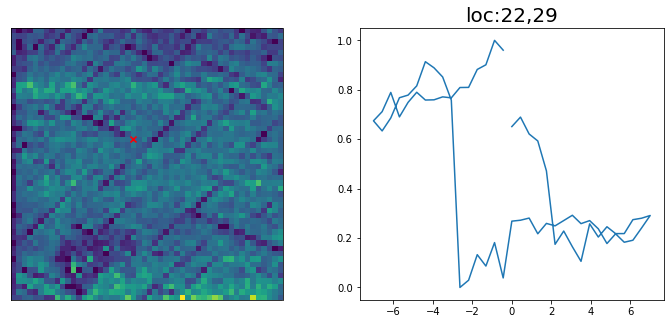

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
i is 1, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #2


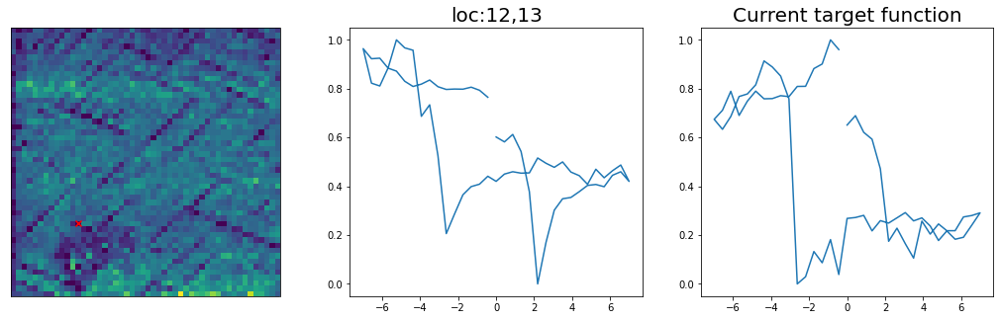

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 2, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #3


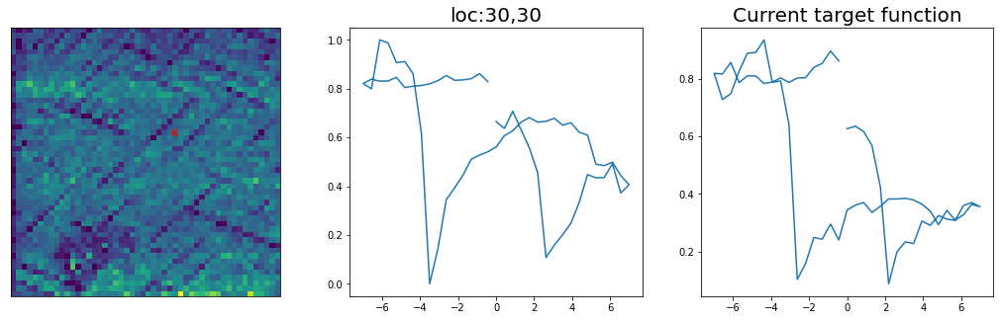

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 3, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #4


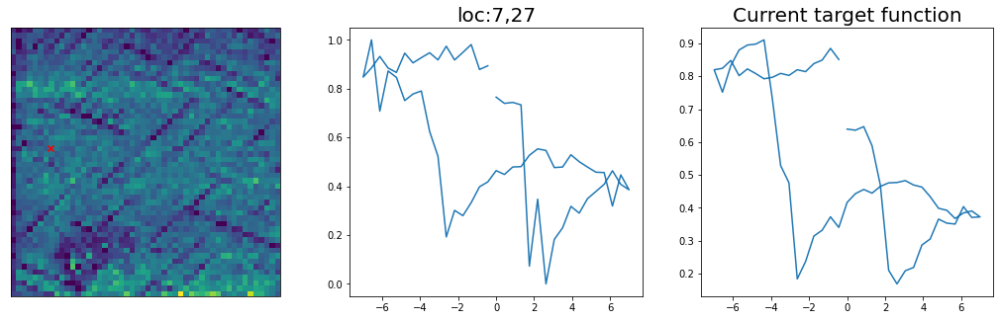

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 4, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #5


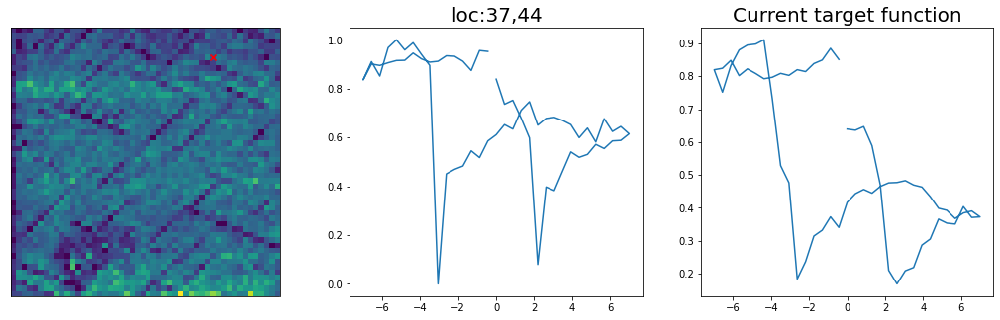

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 5, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #6


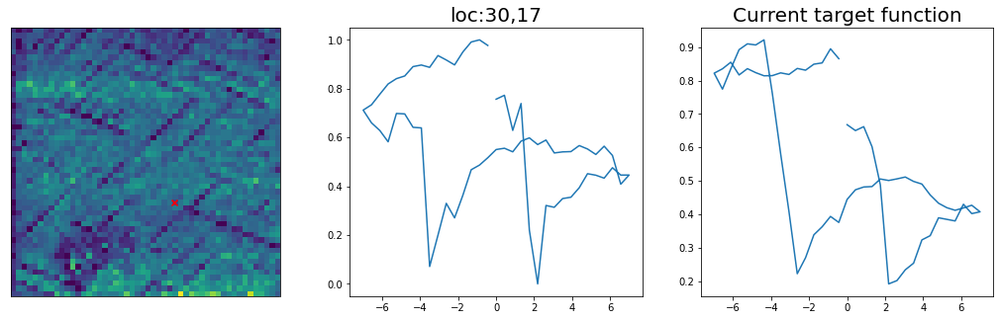

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 6, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #7


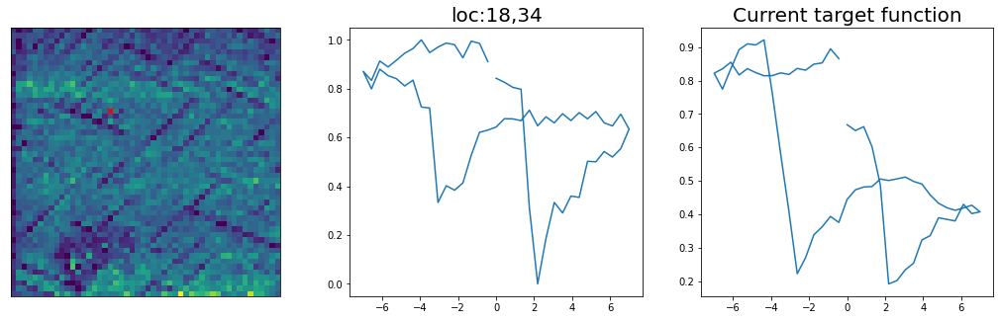

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 7, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #8


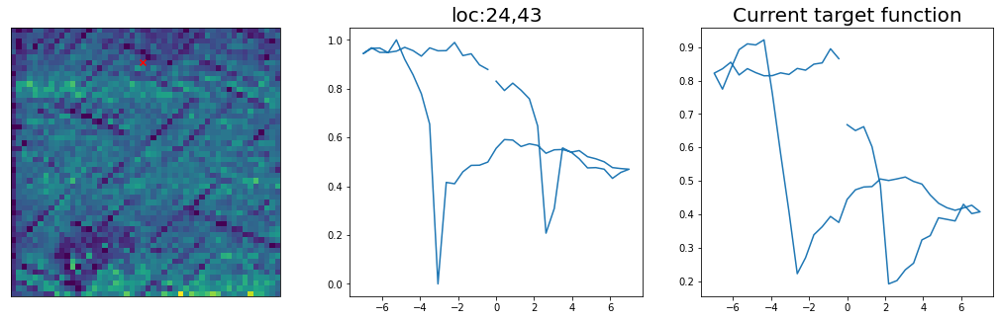

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 8, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #9


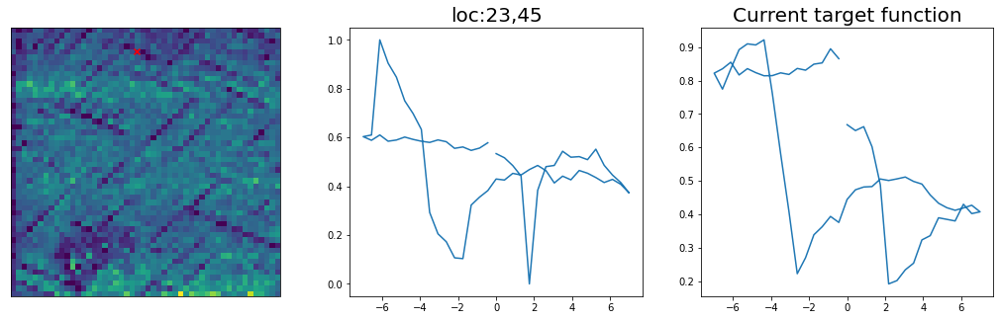

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 9, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #10


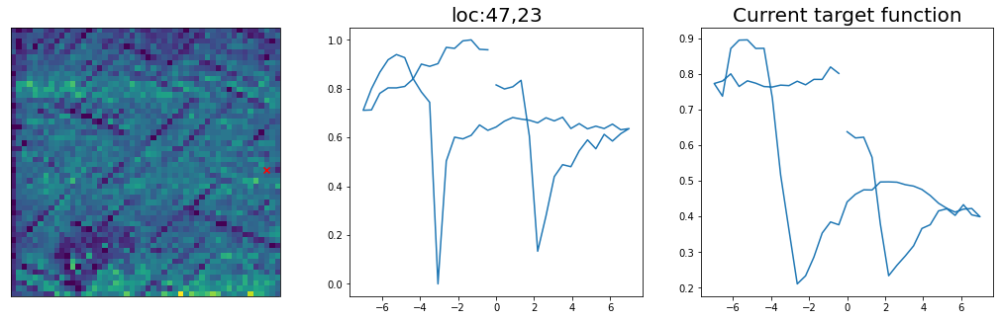

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 


In [ ]:
def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured,:] = full_dataset[points_measured,:]
    return ampdat_masked, points_measured

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(idx)
last_points_measured = np.array(points_measured)
vdc = vdc_vec

train_Y = torch.empty((num_start, 1))
pref = torch.empty((num_start, 1))
init_spec = torch.empty((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = torch.zeros(img.shape[0],img.shape[0],spec_length)
#Evaluate initial training data
x = torch.empty((1,2))

# First generate target loop, based on initial training data
wcount_good= 0
target_func = torch.zeros(spec_length)

mask = np.isin(points_measured, last_points_measured, invert = True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    
    ##******************experiment start*******************##
    time.sleep(0.1)

    idx_x = int(train_indices[i, 0])
    idx_y = int(train_indices[i, 1])

    next_loc = np.asarray([idx_x, idx_y])
    
    print("i is {}, measurement done".format(i))
    
    mask = np.isin(points_measured, last_points_measured, invert = True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured,:]

    new_spec_x = torch.from_numpy(vdc_vec)
    new_spec_y = torch.from_numpy(new_iv)[i,:]
    

    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y, 
                                                              img, wcount_good, target_func)
    m = m + 1


# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  idx_x = int(train_indices[i, 0])
  idx_y = int(train_indices[i, 1])
  spec_y = eval_spec_y[idx_x, idx_y, :]
  #print(idx_x, idx_y, spec_y)
  train_Y[i, 0] = play_varTBO.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m


In [ ]:
train_Y

tensor([[2.4995],
        [2.6351],
        [2.6990],
        [0.5113],
        [1.6278],
        [0.5604],
        [0.6086],
        [0.5892],
        [2.5694],
        [2.7043]])

# Initial evaluation complete. Start BO

step:  1
Sample #11




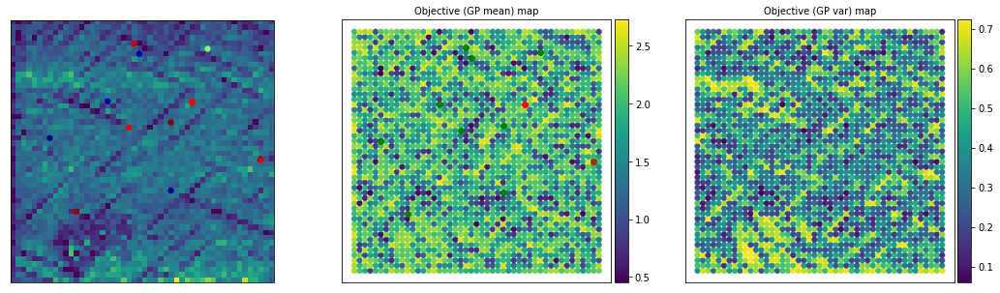

Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


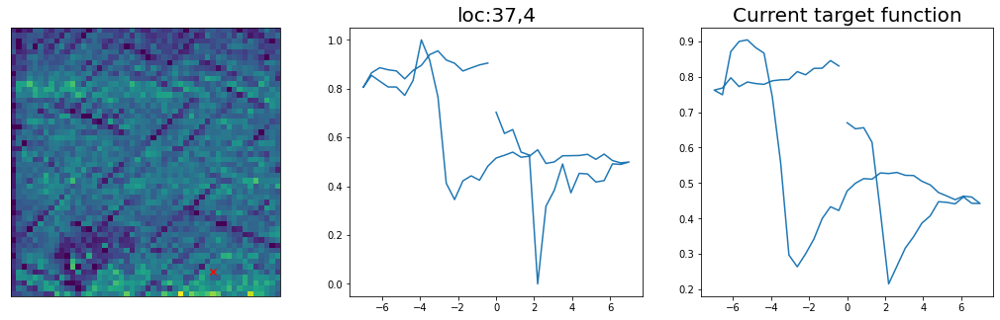

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
step:  2
Sample #12


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


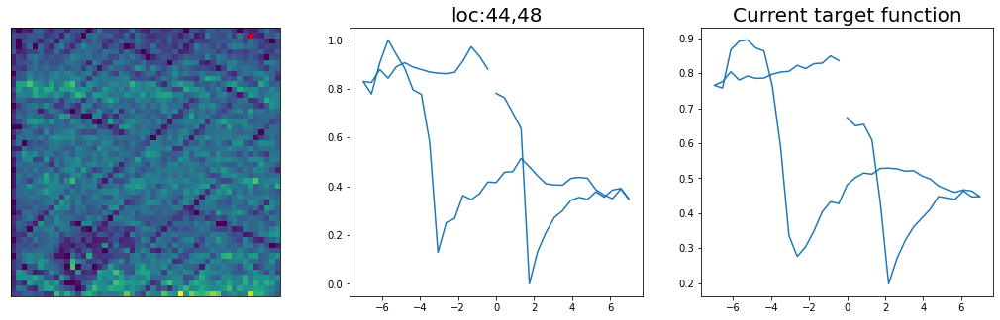

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
step:  3
Sample #13


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


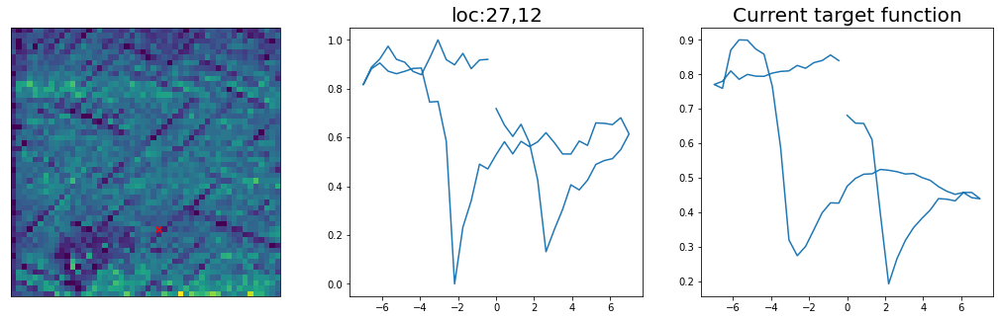

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
step:  4
Sample #14


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


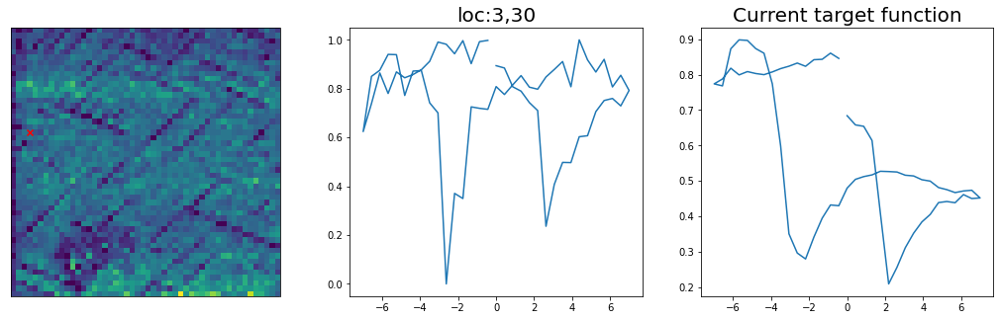

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
step:  5
Sample #15


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


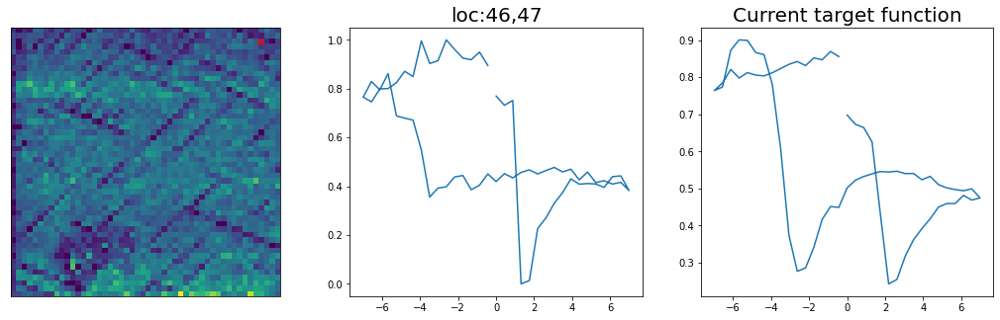

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
step:  6
Sample #16


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: y
Spectral target now fixed. Continue automated BO...


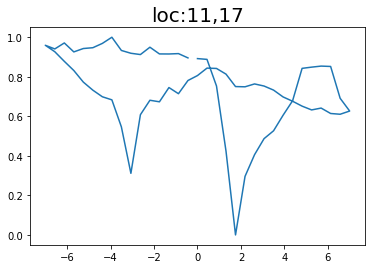

step:  7
Sample #17




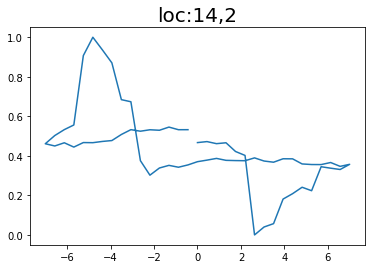

step:  8
Sample #18




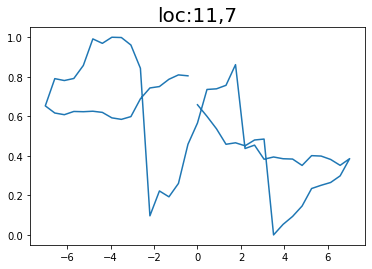

step:  9
Sample #19




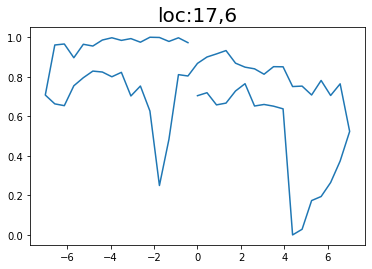

step:  10
Sample #20




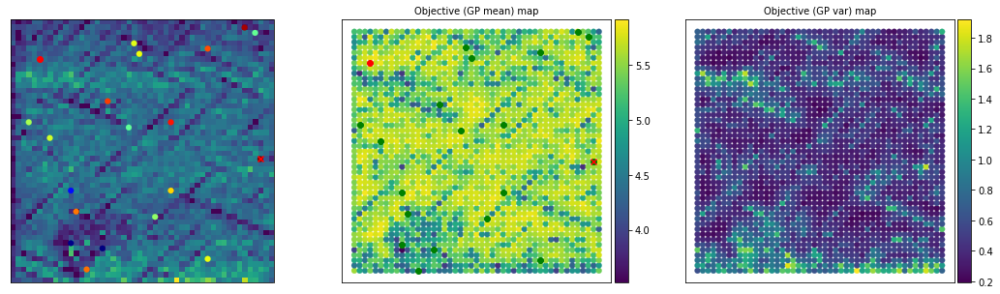

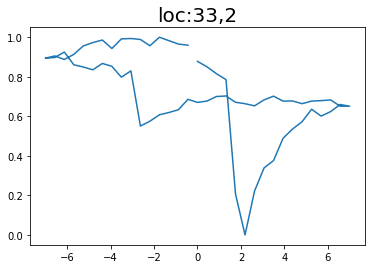

step:  11
Sample #21




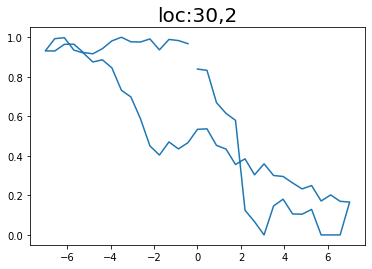

step:  12
Sample #22




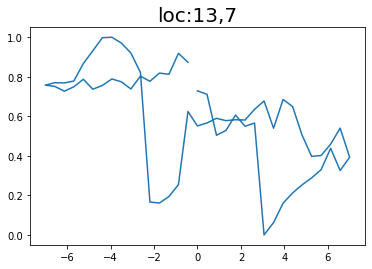

step:  13
Sample #23




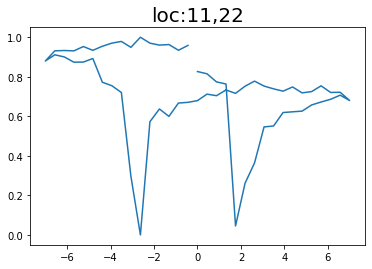

step:  14
Sample #24




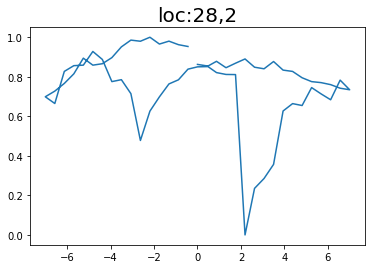

step:  15
Sample #25




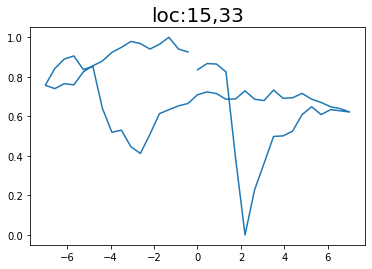

step:  16
Sample #26




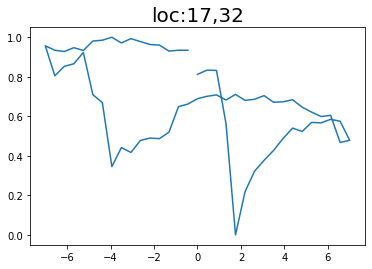

step:  17
Sample #27




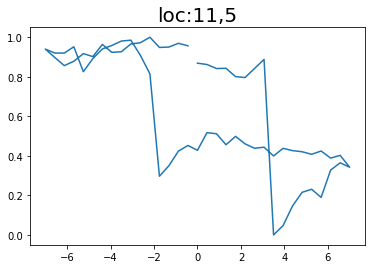

step:  18
Sample #28




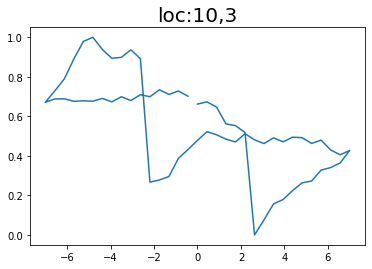

step:  19
Sample #29




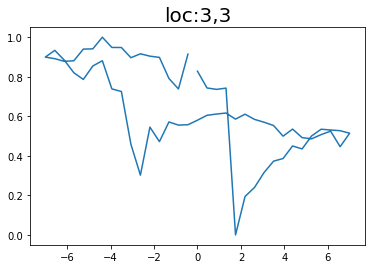

step:  20
Sample #30




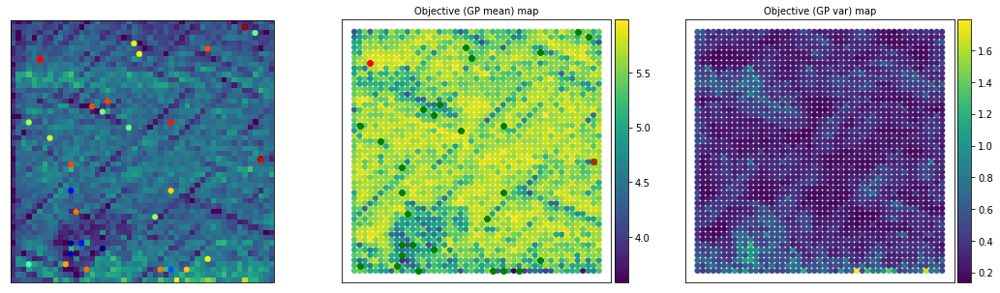

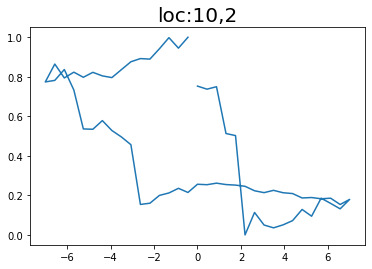

step:  21
Sample #31




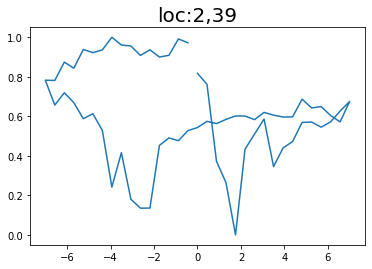

step:  22
Sample #32




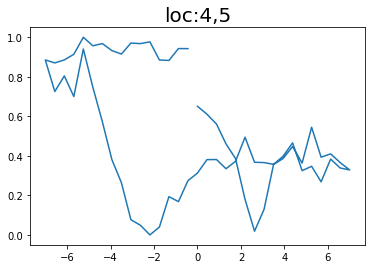

step:  23
Sample #33




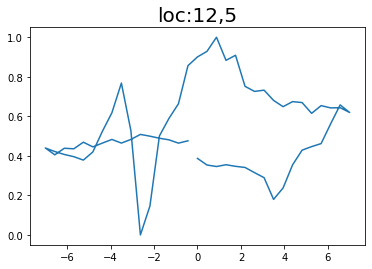

step:  24
Sample #34




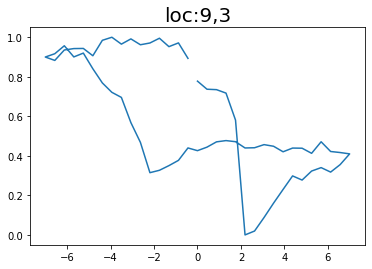

step:  25
Sample #35




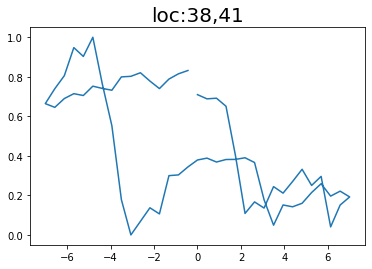

step:  26
Sample #36




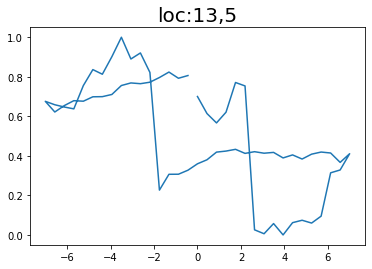

step:  27
Sample #37




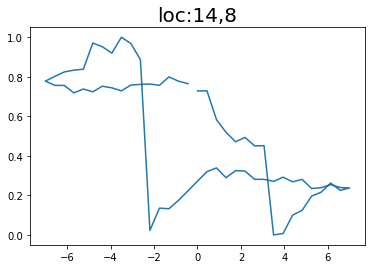

step:  28
Sample #38




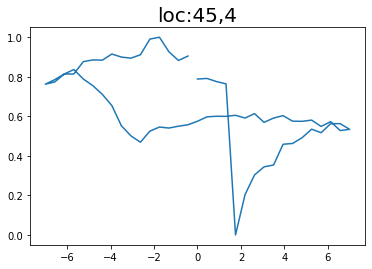

step:  29
Sample #39




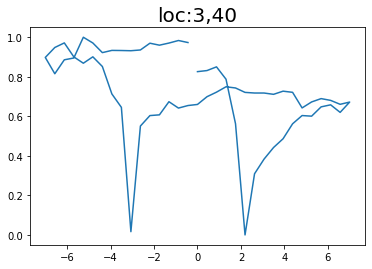

step:  30
Sample #40




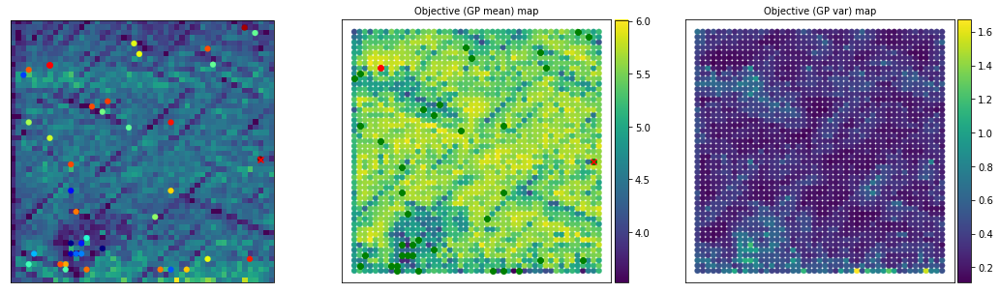

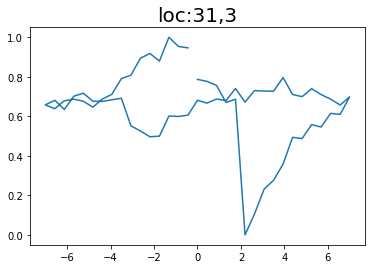

step:  31
Sample #41




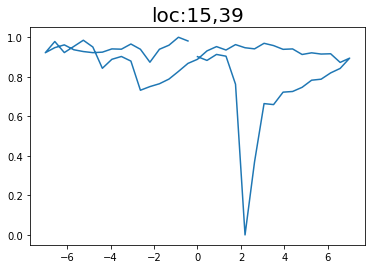

step:  32
Sample #42




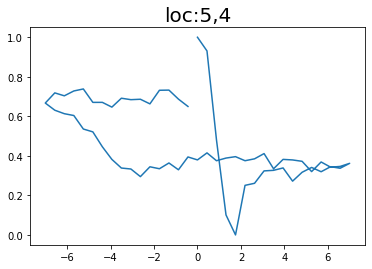

step:  33
Sample #43




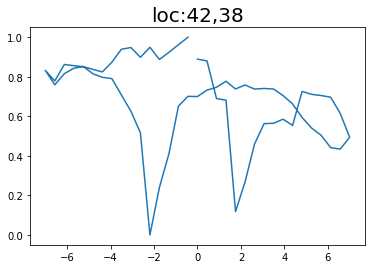

step:  34
Sample #44




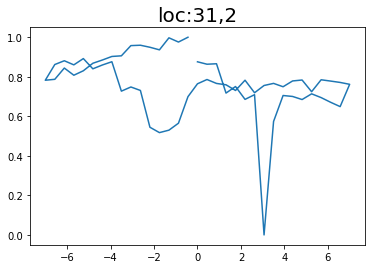

step:  35
Sample #45




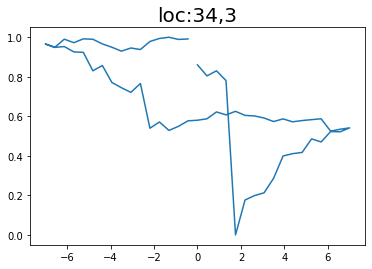

step:  36
Sample #46




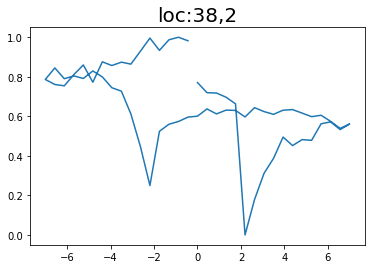

step:  37
Sample #47




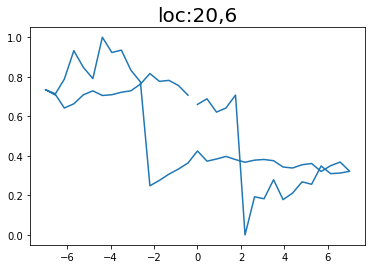

step:  38
Sample #48




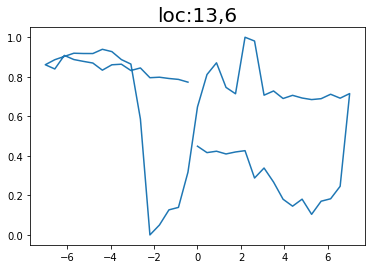

step:  39
Sample #49




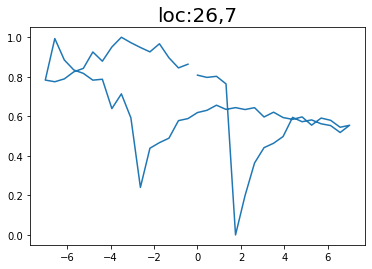

step:  40
Sample #50




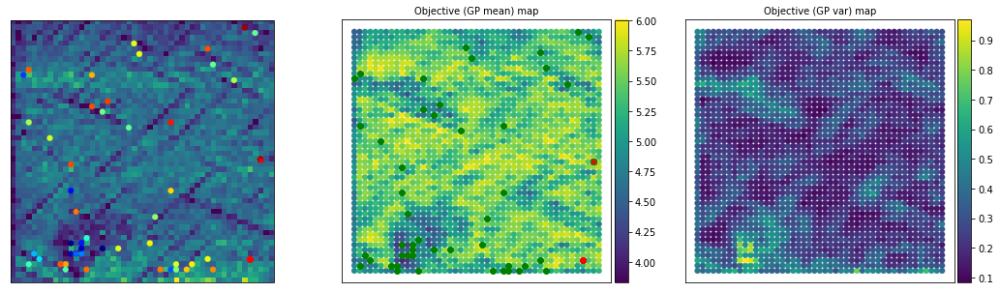

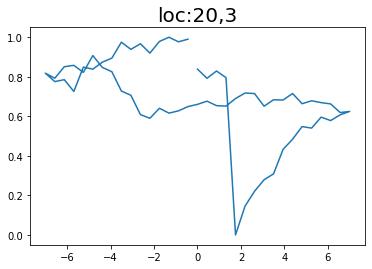

step:  41
Sample #51




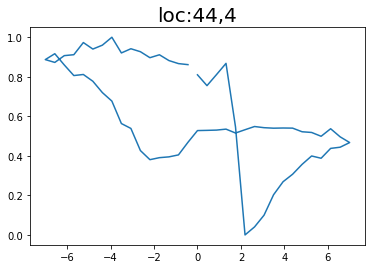

step:  42
Sample #52




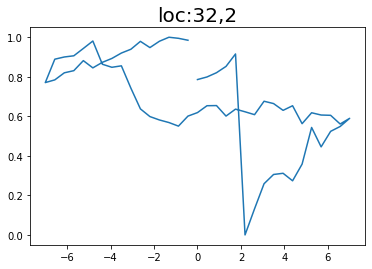

step:  43
Sample #53




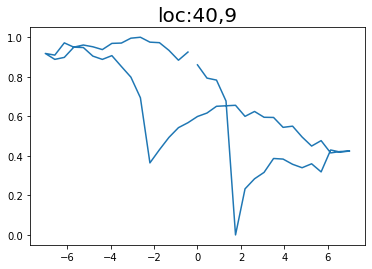

step:  44
Sample #54




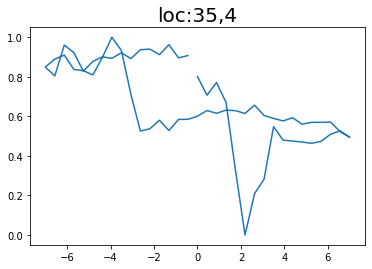

step:  45
Sample #55




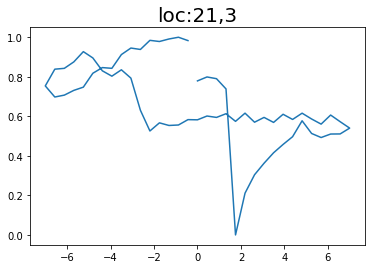

step:  46
Sample #56




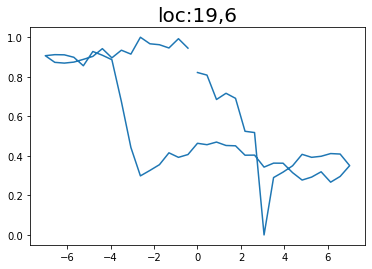

step:  47
Sample #57




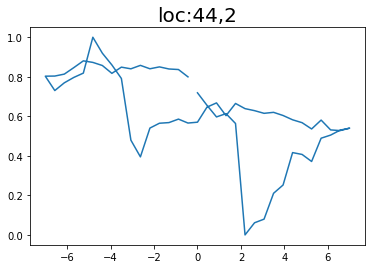

step:  48
Sample #58




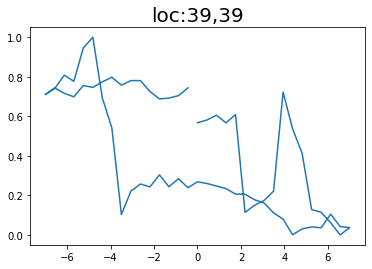

step:  49
Sample #59




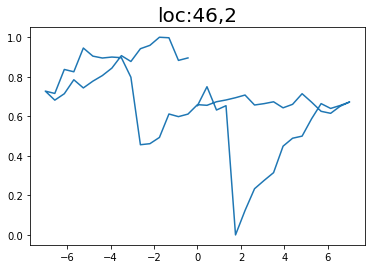

step:  50
Sample #60




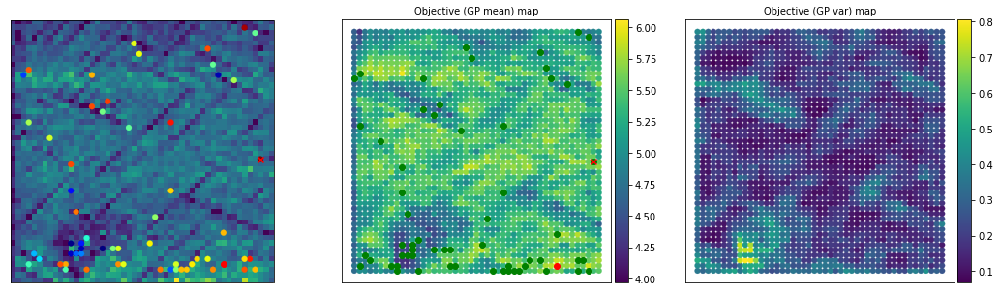

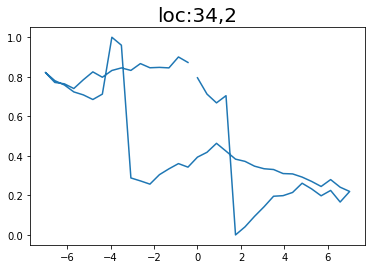

step:  51
Sample #61




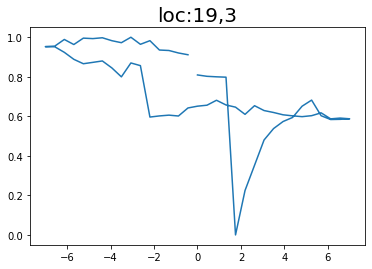

step:  52
Sample #62




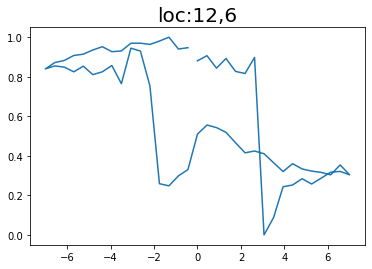

step:  53
Sample #63




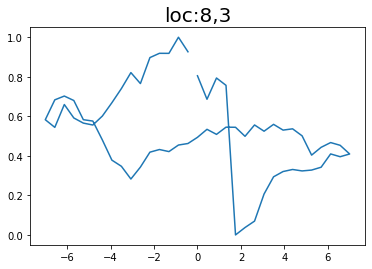

step:  54
Sample #64




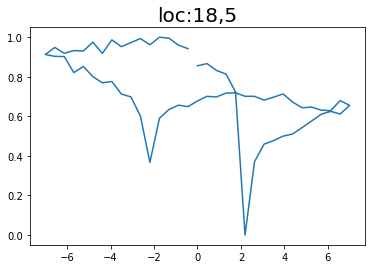

step:  55
Sample #65




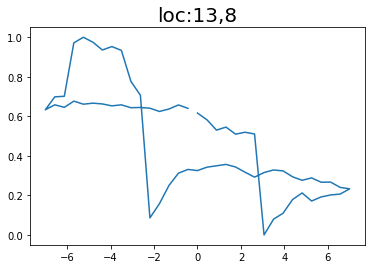

step:  56
Sample #66




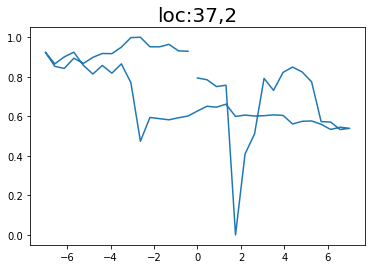

step:  57
Sample #67




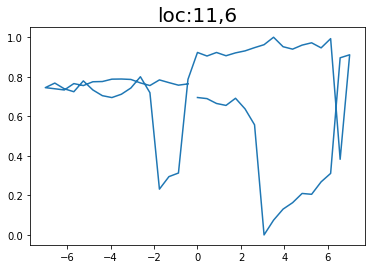

step:  58
Sample #68




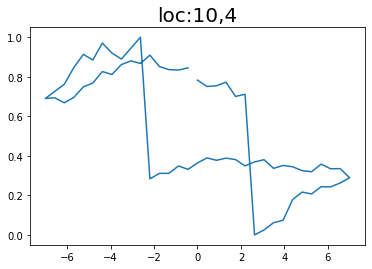

step:  59
Sample #69




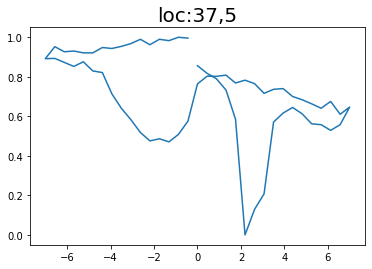

step:  60
Sample #70




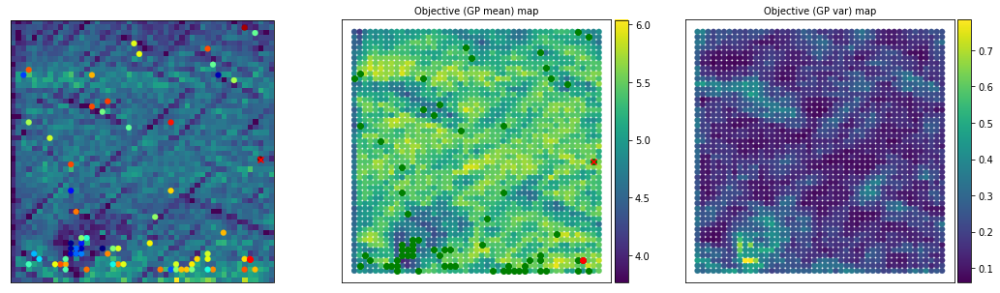

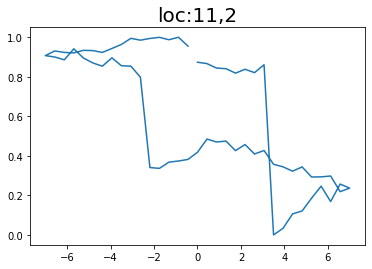

step:  61
Sample #71




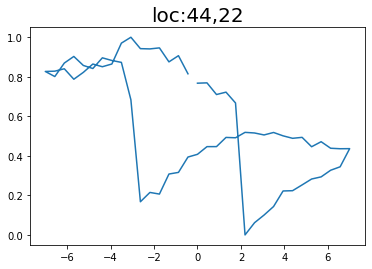

step:  62
Sample #72




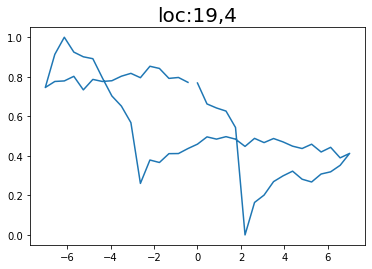

step:  63
Sample #73




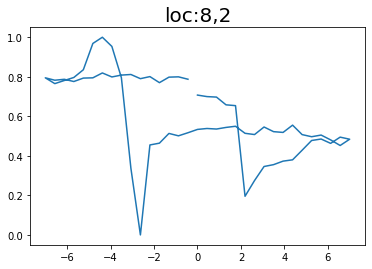

step:  64
Sample #74




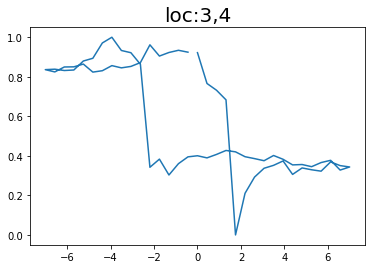

step:  65
Sample #75




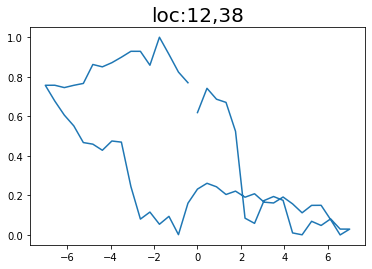

step:  66
Sample #76




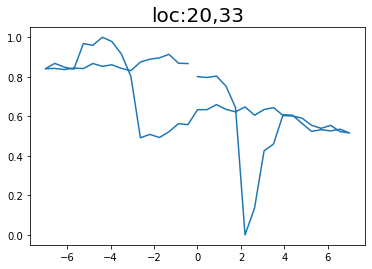

step:  67
Sample #77




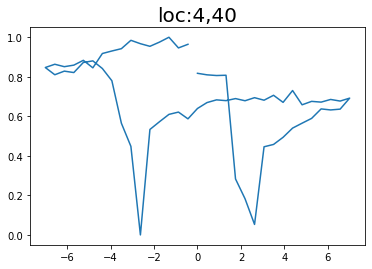

step:  68
Sample #78




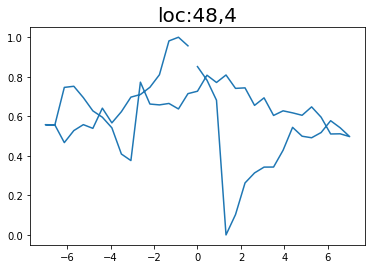

step:  69
Sample #79




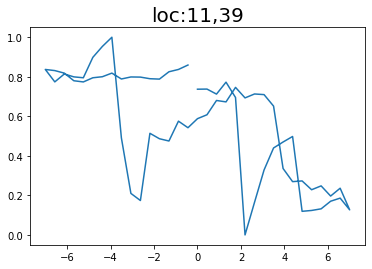

step:  70
Sample #80




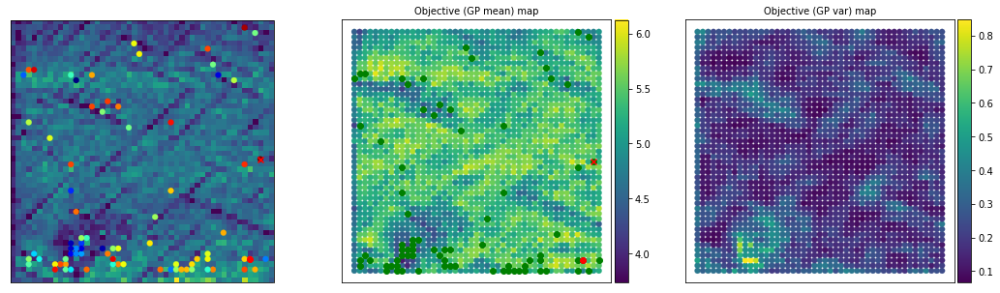

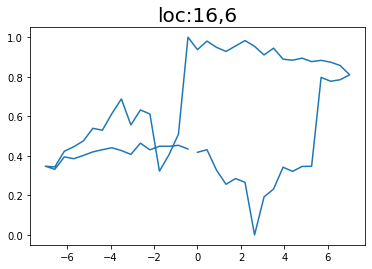

step:  71
Sample #81




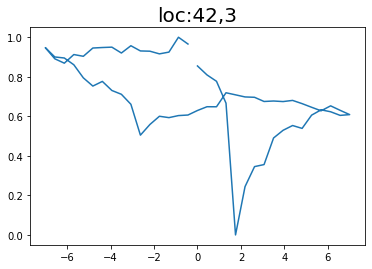

step:  72
Sample #82




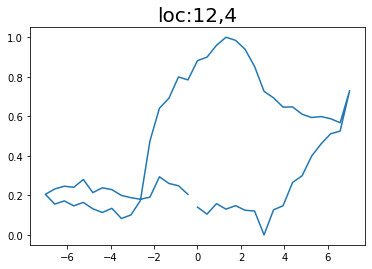

step:  73
Sample #83




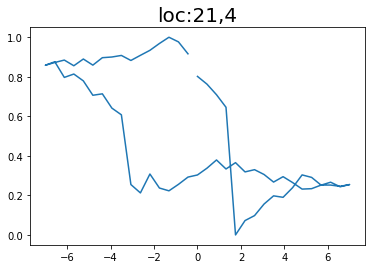

step:  74
Sample #84




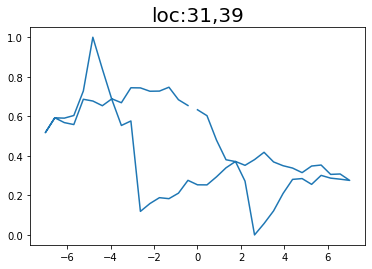

step:  75
Sample #85




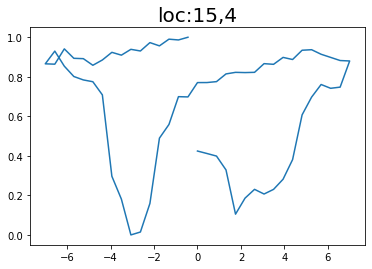

step:  76
Sample #86




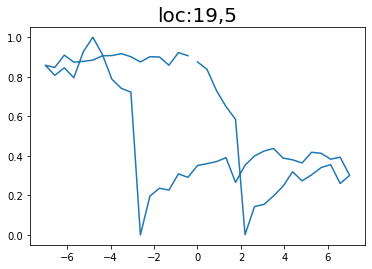

step:  77
Sample #87




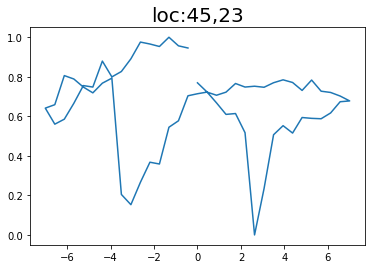

step:  78
Sample #88




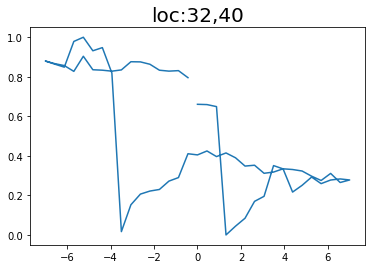

step:  79
Sample #89




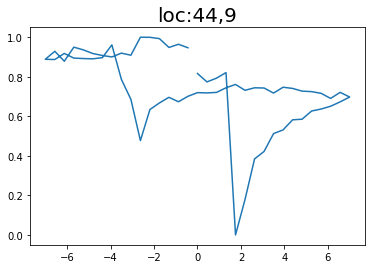

step:  80
Sample #90




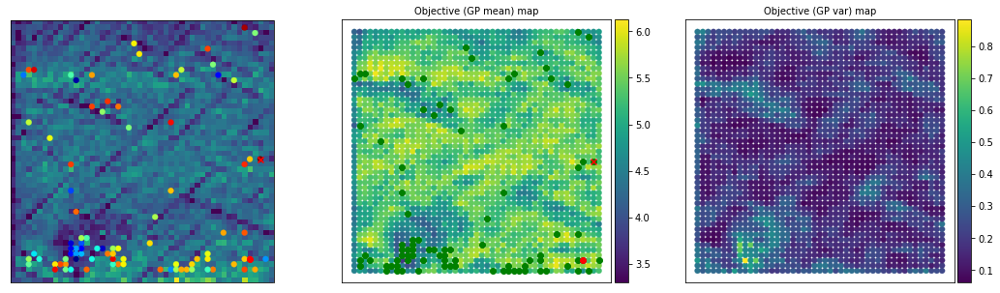

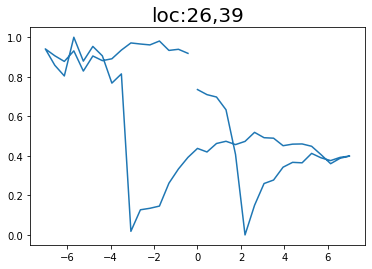

step:  81
Sample #91




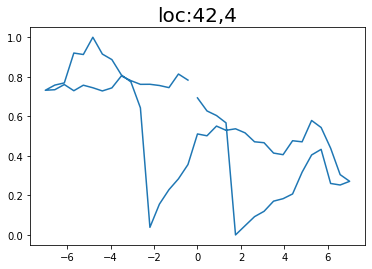

step:  82
Sample #92




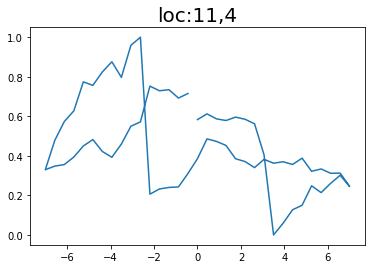

step:  83
Sample #93




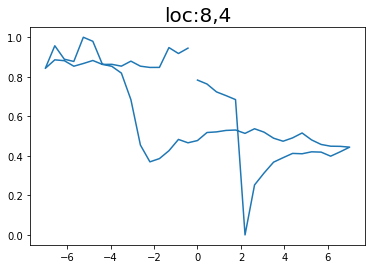

step:  84
Sample #94




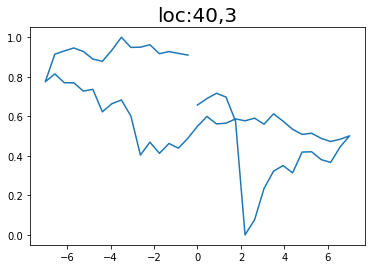

step:  85
Sample #95




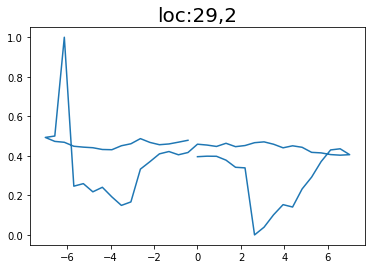

step:  86
Sample #96




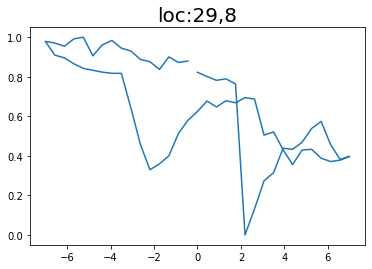

step:  87
Sample #97




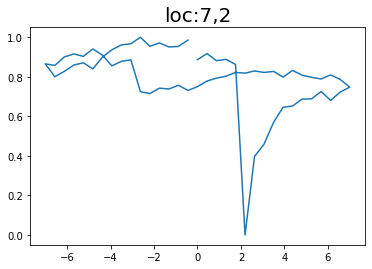

step:  88
Sample #98




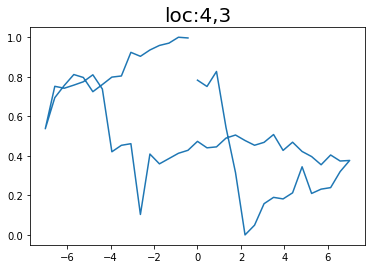

step:  89
Sample #99




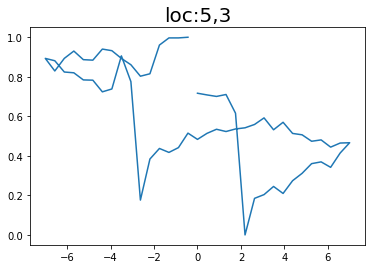

step:  90
Sample #100




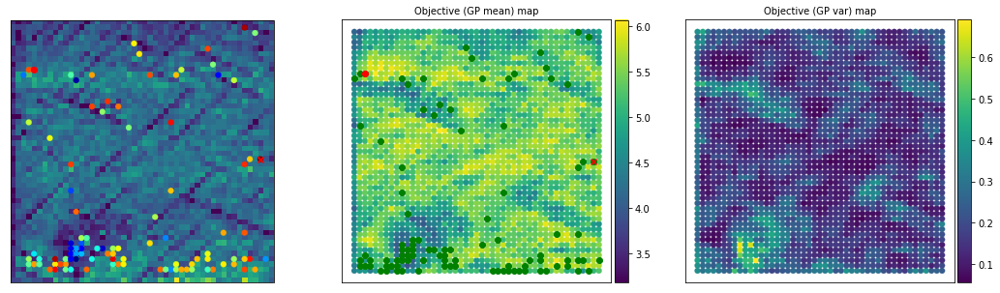

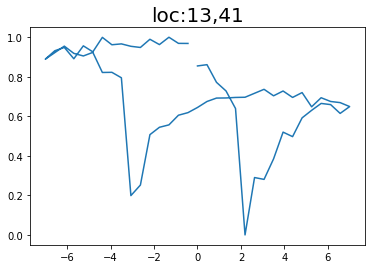

step:  91
Sample #101




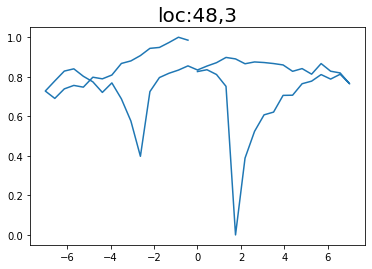

step:  92
Sample #102




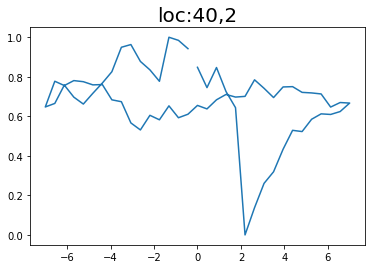

step:  93
Sample #103




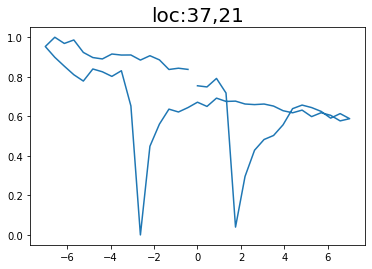

step:  94
Sample #104




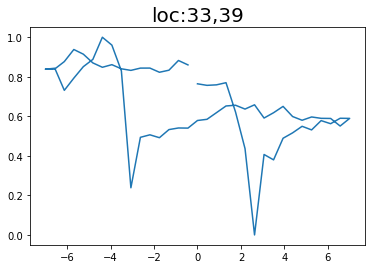

step:  95
Sample #105




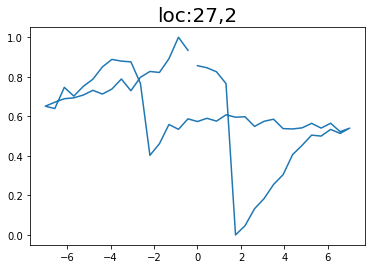

step:  96
Sample #106




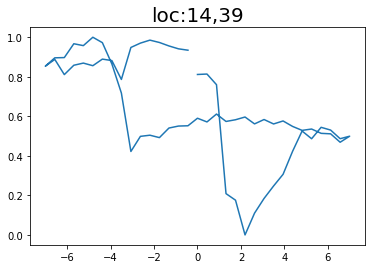

step:  97
Sample #107




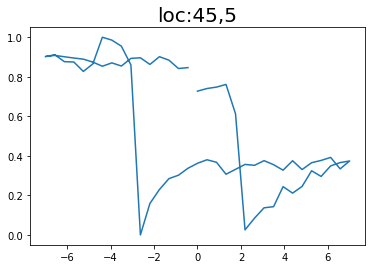

step:  98
Sample #108




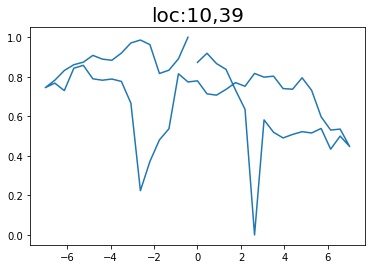

step:  99
Sample #109




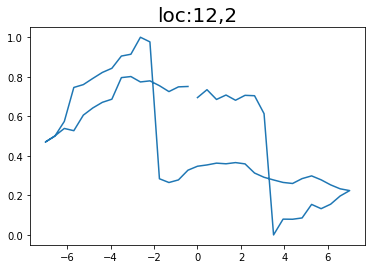

step:  100
Sample #110




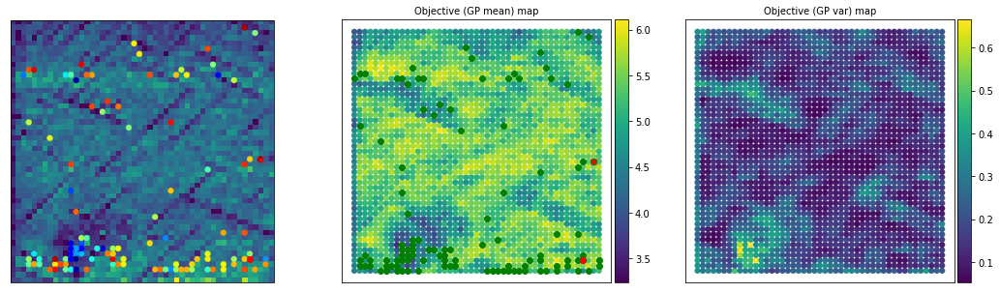

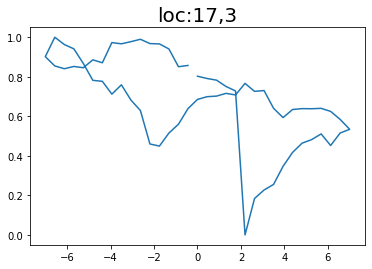



#####----Max. sampling reached, model stopped----#####


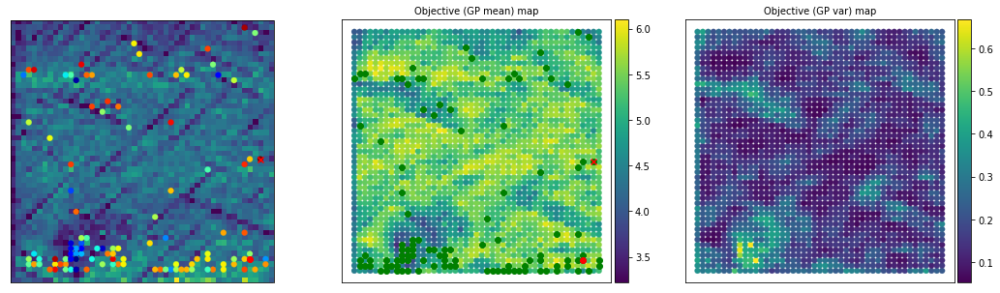

/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  arr = np.asanyarray(arr)
/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [ ]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
switch_obj_index = 0 # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
#Set up the surrogat emodel
gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1)+ "\n\n")
    # Calculate posterior for analysis for intermidiate iterations
    y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
    
    #Plot every tenth iteration after running the evaluation
    if ((i == 1) or ((i % 10) == 0)):
        #This will estimate the surrogate
        X_eval, X_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
        #print(X_eval, X_GP)
        fig = plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)
        #put the savefig within the plot function
        #fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #calculate acquisition function
    acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
    val = acq_val
    ind = np.random.choice(acq_cand) # When multiple points have same acq values
    idx = np.hstack((idx, ind))
    #print(new_points_measured, idx)

    ## Find next point which maximizes the learning through exploration-exploitation
    if (i == 1):
        val_ini = val
      # Check for convergence
    if ((val) < 0):  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = torch.empty((1, test_X.shape[1]))
        nextX_norm = torch.empty(1, test_X_norm.shape[1])
        next_indices = torch.empty((1,2))
        nextX[0,:] = test_X[ind, :]
        nextX_norm [0, :] = test_X_norm[ind, :]
        next_indices[0, :] = indices[ind, :]
        idx_x = int(next_indices[0, 0])
        idx_y = int(next_indices[0, 1])

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx
        
        #polarization loop area
        IV, points_measured = return_new_measurement(targets, new_points_measured)

        new_iv = IV[points_measured,:]

        new_spec_x = torch.from_numpy(vdc_vec)
        new_spec_y = torch.from_numpy(new_iv)[-1]

      
        new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
        
        #clear_output(wait=True) Comment out as I need to check the run in colab
        
        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_indices, train_Y, var_params, switch_obj_index, m =\
        play_varTBO.augment_newdata_KL(nextX, nextX_norm, next_indices, train_X, train_X_norm, train_indices, train_Y,
                                        new_spec_x, new_spec_y, eval_spec_y, img, var_params, switch_obj_index, m)


        #print(next_indices)
        # Gp model fit
        # Updating GP with augmented training data
        gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)
# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_indices, train_indices, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data]

#Save few data
np.save("optim_results", optim_results)

# Classification

Text(0.5, 1.0, 'Image classification')

<Figure size 432x288 with 0 Axes>

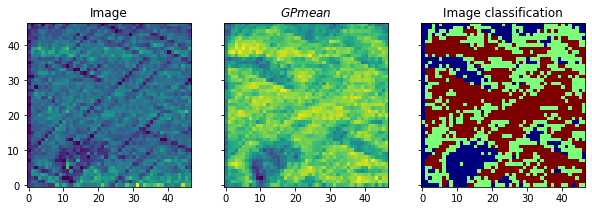

In [ ]:
z1_org = final_GP_estim[0]
d1 = int(z1_org.shape[0]**(1/2))
d2 = d1
z1_org = z1_org.reshape(d1,d2)
z1_org = (z1_org-torch.min(z1_org))/(torch.max(z1_org)-torch.min(z1_org))

#Denoising the image using bilateral filter

z1 = denoise_bilateral(z1_org.detach().numpy(), sigma_color=0.05, sigma_spatial=5)


#Determining threshold from otsu algo to separate between foreground and background images
val1 = filters.threshold_multiotsu(z1, classes = 3)
emag_z1 = np.digitize(z1, bins=val1)

plt.figure()
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 15), sharex=True, sharey=True)

ax[0].imshow(img, origin = "lower")
ax[0].set_title("Image")
ax[1].imshow(z1_org, origin="lower", cmap="viridis")
ax[1].set_title("$GP mean$")
ax[2].imshow(emag_z1, origin="lower", cmap="jet")
ax[2].set_title("Image classification")



In [ ]:
print(X_opt, X_opt_GP, var_params, explored_data, final_GP_estim)

tensor([[23., 47.]]) tensor([[ 4., 45.]]) [15.0, tensor([[2.],
        [2.],
        [2.],
        [0.],
        [1.],
        [0.],
        [0.],
        [0.],
        [2.],
        [2.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.]]), tensor([0.6981, 0.6732, 0.6643, 0.6258, 0.4316, 0.2429, 0.2550, 0.3180, 0.3622,
        0.3919, 0.4186, 0.4502, 0.4596, 0.4594, 0.4814, 0.4690, 0.4748, 0.4992,
        0.4941, 0.4973, 0.5017, 0.5105, 0.5329, 0.5237, 0.5406, 0.5404, 0.5467,
        0.5446, 0.5459, 0.5395, 0.5325, 0.5226, 0.5017, 0.4491, 0.4514, 0.4170,
        0.3420, 0.2860, 0.2769, 0.3741, 0.6083, 0.7804, 0.8611, 0.8667, 0.8993,
        0.9009, 0.8731, 0.7737, 0.7639, 0.7845, 0.8212, 0.7979, 0.8125, 0.8058,
        0.8037, 0.8122, 0.8232, 0.8348, 0.8425, 0.8314, 0.8523, 0.8471, 0.8694,
        0.8559], dtype=torch.float64)] [tensor([[29., 22.],
        [13., 12.],
        [30., 30.],
        [27.,  7.],
        [44., 37.],
        [17., 30.],
        [34., 18.],

#################################################################
Display best spectrals


<Figure size 432x288 with 0 Axes>

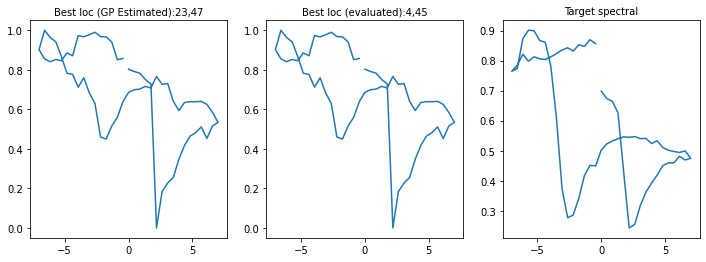

#################################################################
End of Analysis


In [ ]:
#Display
print("#################################################################")
print("Display best spectrals")
plt.figure()

fig,ax=plt.subplots(ncols=3,figsize=(12,4))

# #Optimal from estimated GP
idx1 = int(X_opt[0, 0])
idx2 = int(X_opt[0, 1])

#new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx1, idx2)

ax[0].plot(new_spec_x, new_spec_y)
ax[0].set_title('Best loc (GP Estimated):' +str(idx1) +"," + str(idx2), fontsize = 10)

#Optimal from evaluated samples
idx1 = int(X_opt_GP[0, 0])
idx2 = int(X_opt_GP[0, 1])

#new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx1, idx2)

ax[1].plot(new_spec_x, new_spec_y)
ax[1].set_title('Best loc (evaluated):' +str(idx1) +"," + str(idx2), fontsize = 10)

ax[2].plot(new_spec_x, var_params[2])
ax[2].set_title('Target spectral', fontsize = 10)
plt.show()
print("#################################################################")
print("End of Analysis")

#Next Data

In [7]:
!gdown https://drive.google.com/uc?id=1iR791jgsJibeoSiw60I_Df61HXk5Flok
pickle_file_loc = r'beps_ground_truth.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']

Downloading...
From: https://drive.google.com/uc?id=1iR791jgsJibeoSiw60I_Df61HXk5Flok
To: /content/beps_ground_truth.p
100% 827M/827M [00:05<00:00, 155MB/s]


In [8]:
spec_length = 64  #spectral data length

amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
img = amp_slices[:,16].reshape(50,50)

vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]

amp_mat = amp_slices[:,-128:][:,1::2]
amp_masked = np.zeros_like(amp_mat)


spec_length = amp_mat.shape[-1]  #spectral data length
specim = np.reshape(amp_mat, (img.shape[0], img.shape[1], spec_length))

print(img.shape, vdc_vec.shape, amp_slices.shape, specim.shape)

(50, 50) (64,) (2500, 256) (50, 50, 64)


In [9]:
window_size = 4

coordinates = aoi.utils.get_coord_grid(img, step=1, return_dict=False)
features, targets, indices = aoi.utils.extract_patches_and_spectra(
    specim, img, coordinates=coordinates, window_size=window_size, avg_pool=1)

features.shape, targets.shape

/usr/local/lib/python3.8/dist-packages/atomai/utils/img.py:450: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  spectra = torch.tensor(spectra).unsqueeze(1)


((2209, 4, 4), (2209, 64))

In [10]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

In [11]:
n, d1, d2 = features.shape
num_start = int(10)
N = int(100)
m = 0
spec_length = 64  #spectral data length



spec_length = amp_mat.shape[-1]  #spectral data length

coordinates = utils.get_coord_grid(img, 1)
X_feas = torch.from_numpy(features.reshape(n, d1*d2))

X_feas_norm = torch.from_numpy(features.reshape(n, d1*d2))

amp_masked = np.zeros_like(targets)
np.random.seed(10)

idx = np.random.randint(0, len(X_feas), num_start)
for ind in range(num_start):
    amp_masked[int(idx[ind]),:] = targets[int(idx[ind]),:]

train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]
indices = torch.from_numpy(indices)
train_indices = indices[idx]

print(X_feas.shape, X_feas_norm.shape,train_X.shape, train_X_norm.shape, train_indices.shape, amp_masked.shape)

torch.Size([2209, 16]) torch.Size([2209, 16]) torch.Size([10, 16]) torch.Size([10, 16]) torch.Size([10, 2]) (2209, 64)


# Initial evaluation

i is 0, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #1


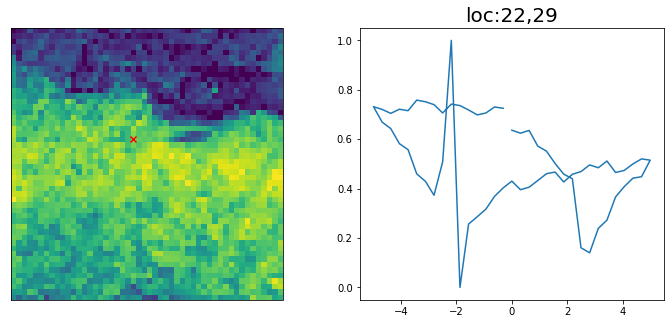

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
i is 1, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #2


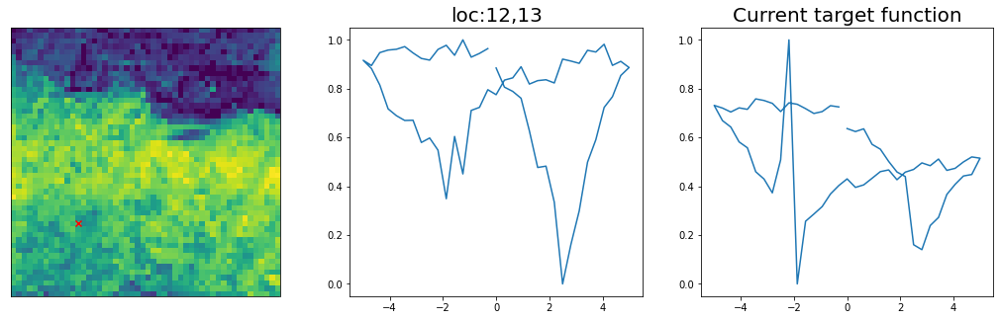

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 2, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #3


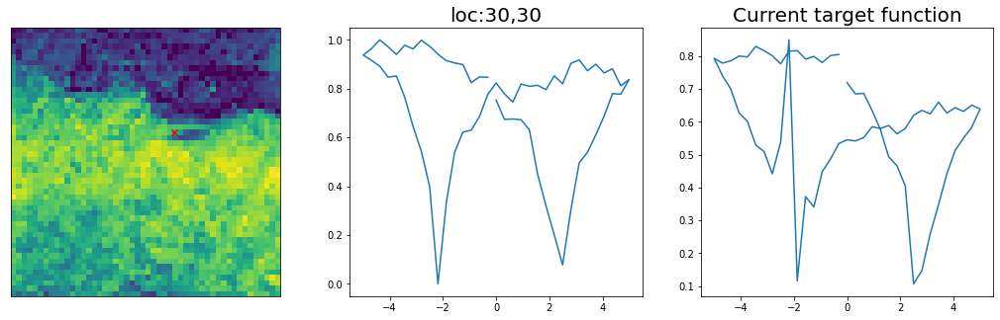

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 3, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #4


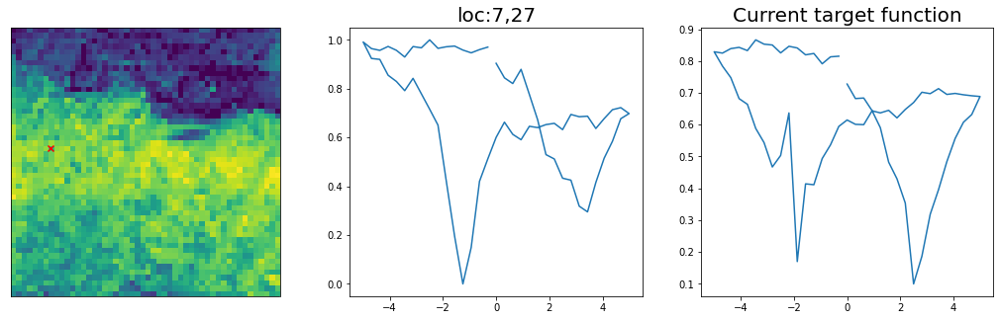

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 4, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #5


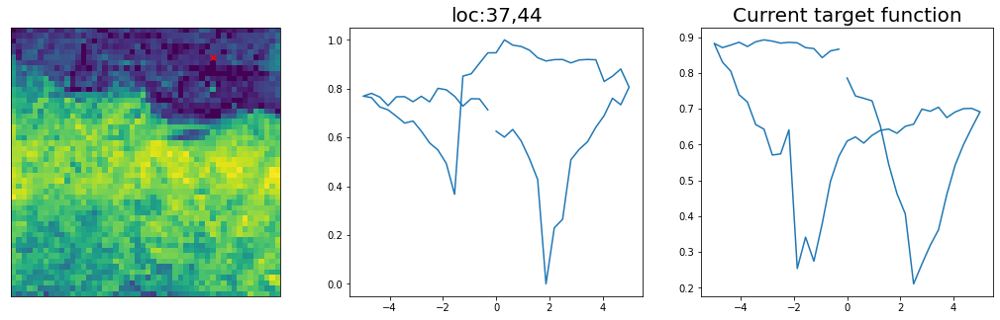

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 5, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #6


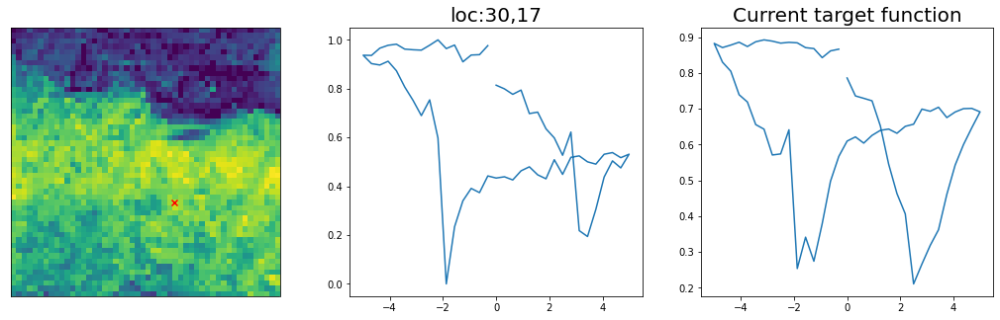

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 6, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #7


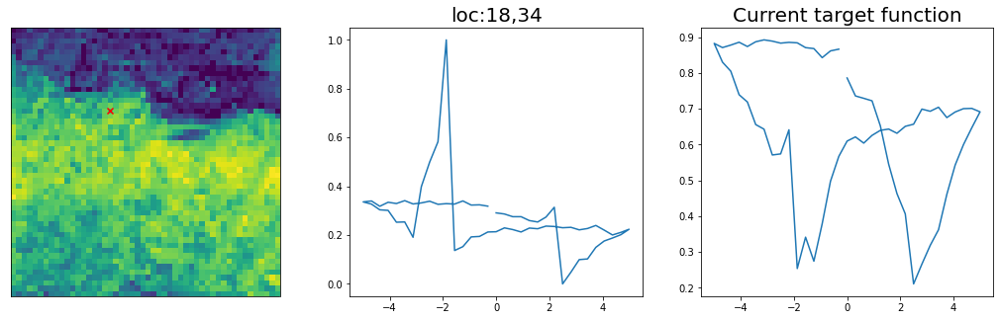

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: x
i is 7, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #8


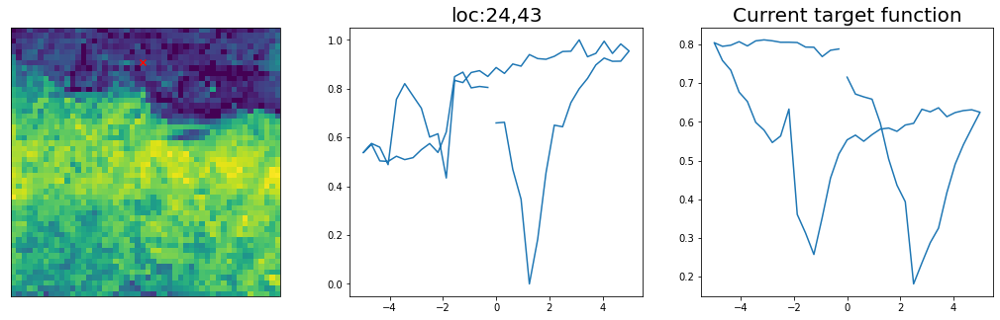

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 8, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #9


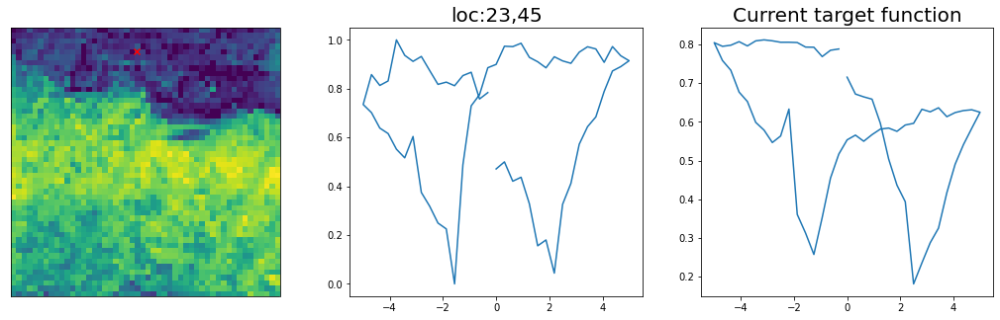

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 9, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #10


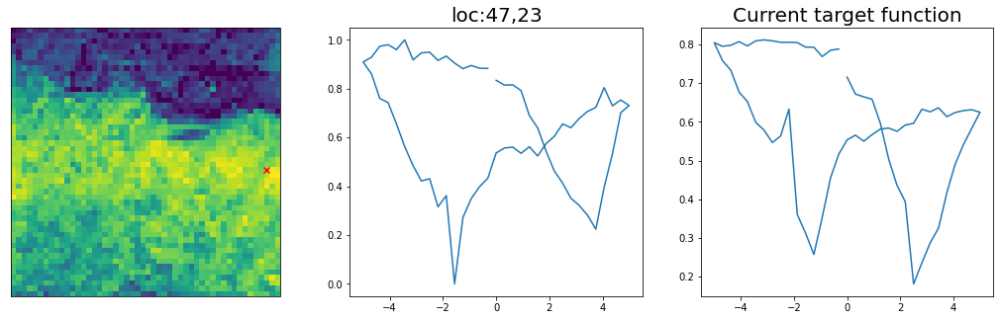

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 


In [12]:
def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured,:] = full_dataset[points_measured,:]
    return ampdat_masked, points_measured

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(idx)
last_points_measured = np.array(points_measured)
vdc = vdc_vec

train_Y = torch.empty((num_start, 1))
pref = torch.empty((num_start, 1))
init_spec = torch.empty((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = torch.zeros(img.shape[0],img.shape[0],spec_length)
#Evaluate initial training data
x = torch.empty((1,2))

# First generate target loop, based on initial training data
wcount_good= 0
target_func = torch.zeros(spec_length)

mask = np.isin(points_measured, last_points_measured, invert = True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    
    ##******************experiment start*******************##
    time.sleep(0.1)

    idx_x = int(train_indices[i, 0])
    idx_y = int(train_indices[i, 1])

    next_loc = np.asarray([idx_x, idx_y])
    
    print("i is {}, measurement done".format(i))
    
    mask = np.isin(points_measured, last_points_measured, invert = True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured,:]

    new_spec_x = torch.from_numpy(vdc_vec)
    new_spec_y = torch.from_numpy(new_iv)[i,:]
    

    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y, 
                                                              img, wcount_good, target_func)
    m = m + 1


# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  idx_x = int(train_indices[i, 0])
  idx_y = int(train_indices[i, 1])
  spec_y = eval_spec_y[idx_x, idx_y, :]
  #print(idx_x, idx_y, spec_y)
  train_Y[i, 0] = play_varTBO.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m


In [13]:
train_Y

tensor([[2.7755],
        [1.6814],
        [1.5983],
        [2.7730],
        [0.4726],
        [0.6790],
        [1.3784],
        [0.1677],
        [0.4563],
        [2.7739]])

# Initial evaluation complete. Start BO

step:  1
Sample #11




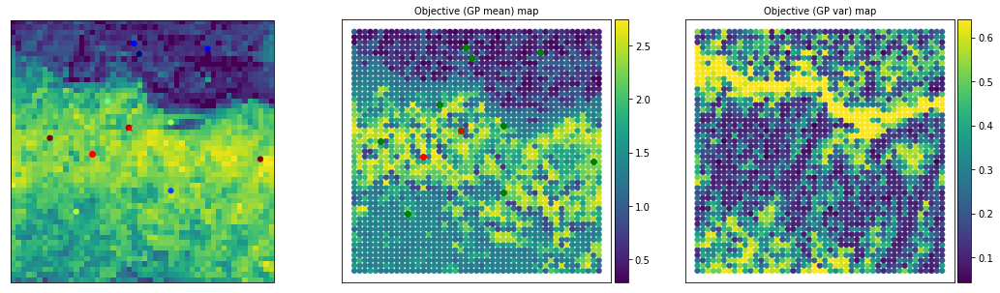

Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


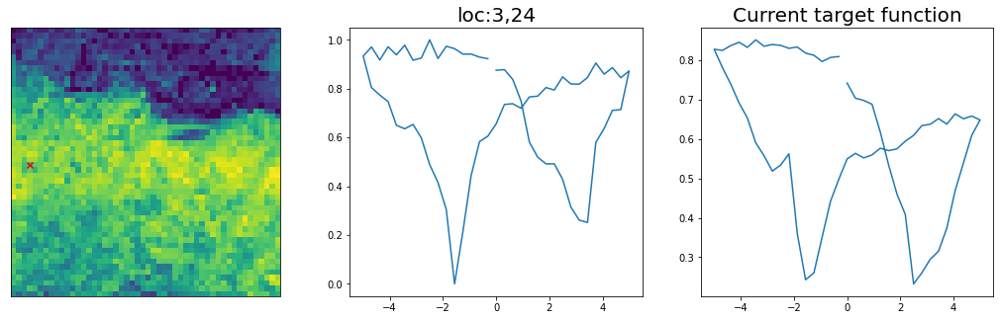

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
step:  2
Sample #12


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


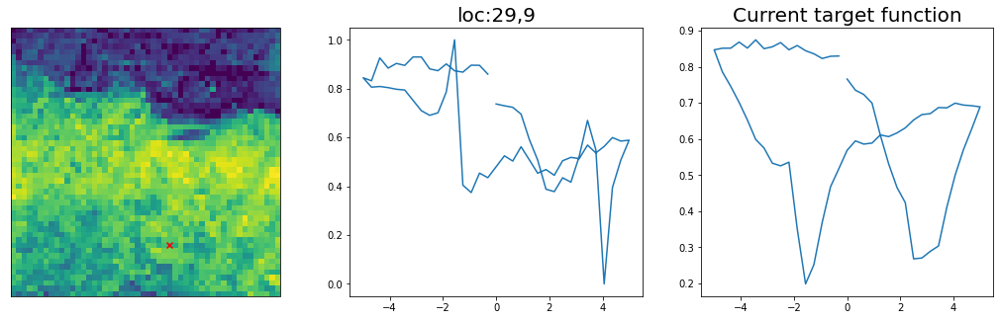

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
step:  3
Sample #13


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: y
Spectral target now fixed. Continue automated BO...


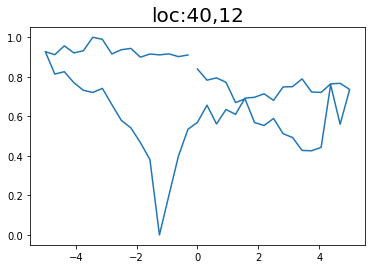

step:  4
Sample #14




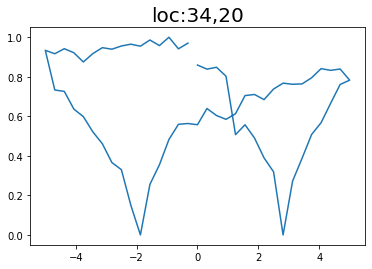

step:  5
Sample #15




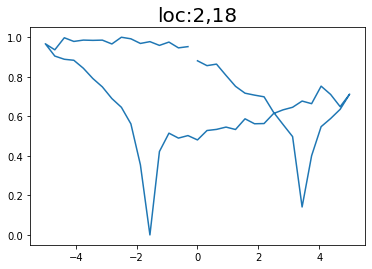

step:  6
Sample #16




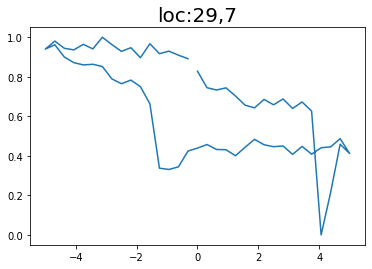

step:  7
Sample #17




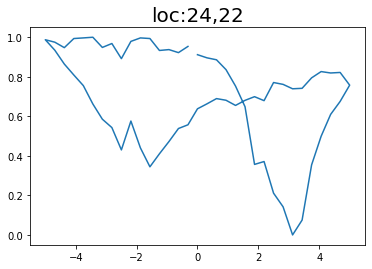

step:  8
Sample #18




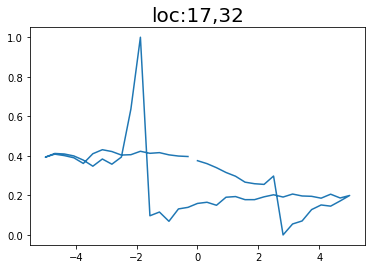

step:  9
Sample #19




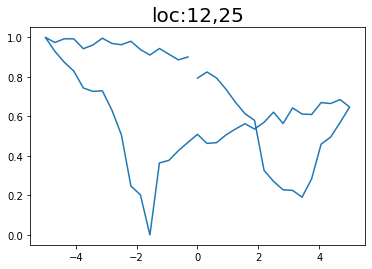

step:  10
Sample #20




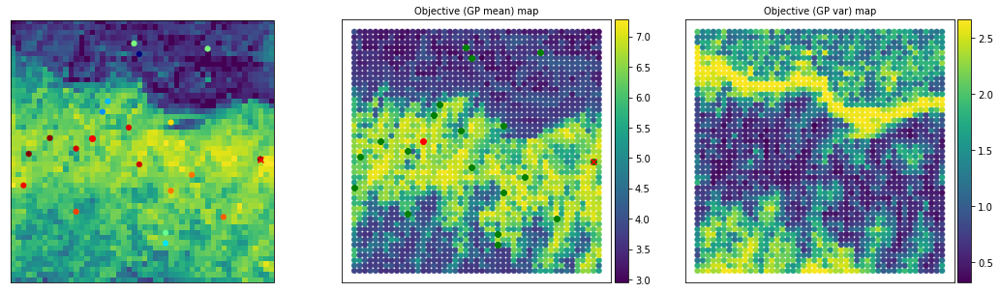

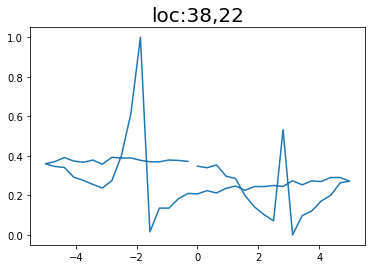

step:  11
Sample #21




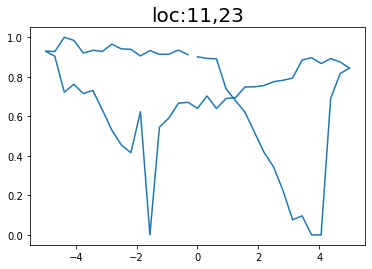

step:  12
Sample #22




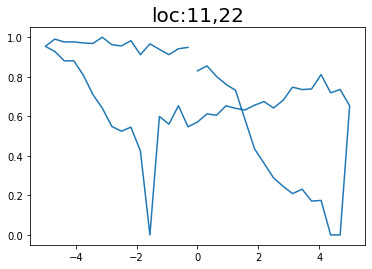

step:  13
Sample #23




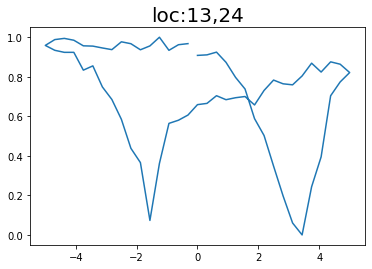

step:  14
Sample #24




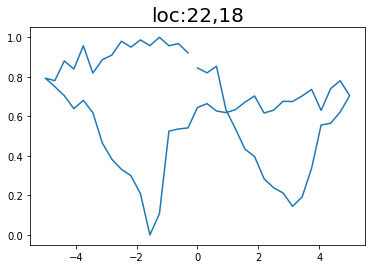

step:  15
Sample #25




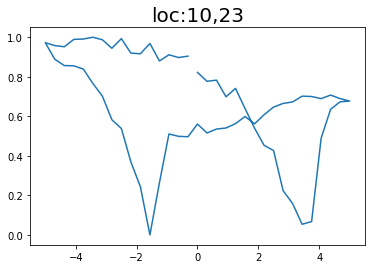

step:  16
Sample #26




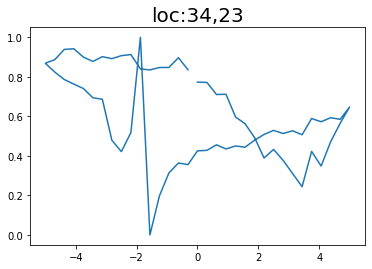

step:  17
Sample #27




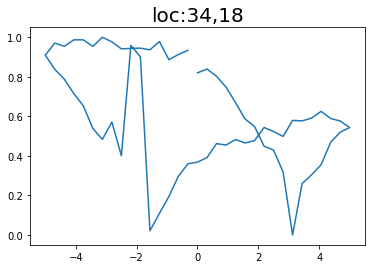

step:  18
Sample #28




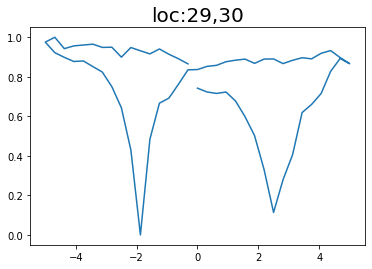

step:  19
Sample #29




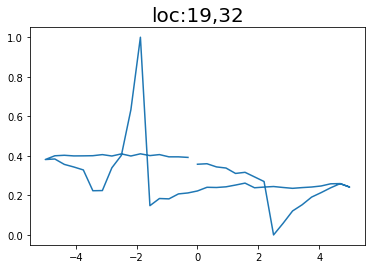

step:  20
Sample #30




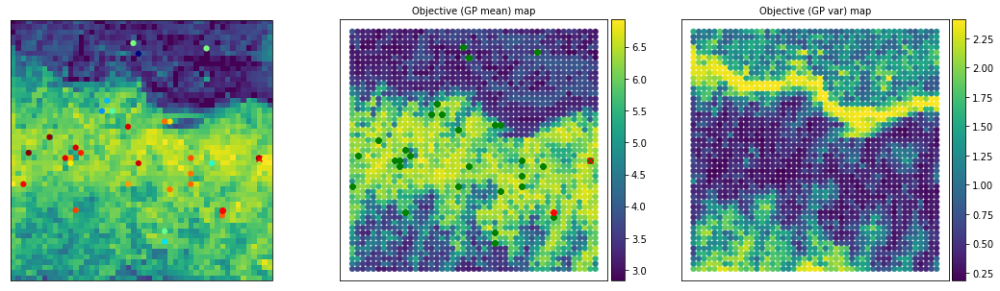

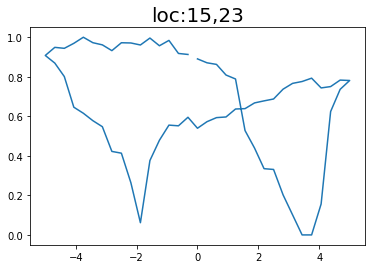

step:  21
Sample #31




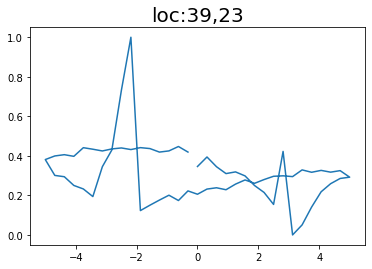

step:  22
Sample #32




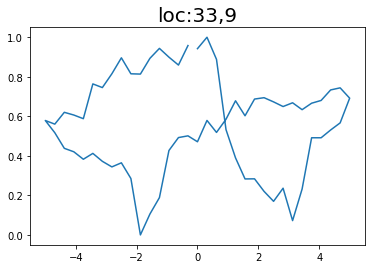

step:  23
Sample #33




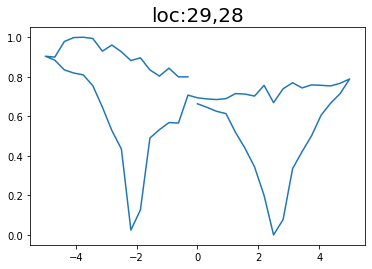

step:  24
Sample #34




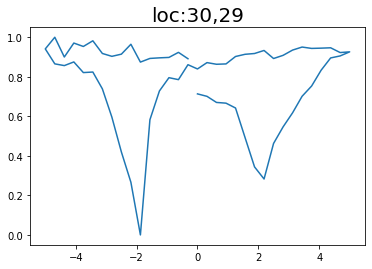

step:  25
Sample #35




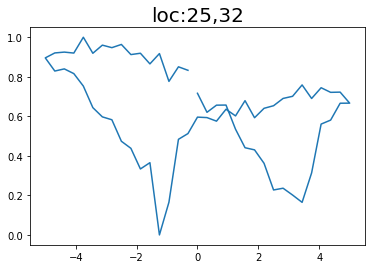

step:  26
Sample #36




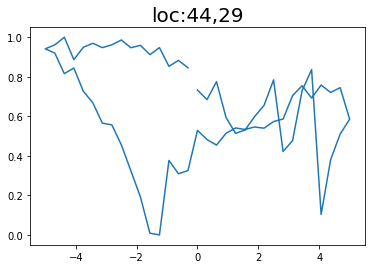

step:  27
Sample #37




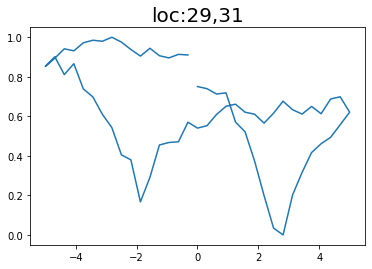

step:  28
Sample #38




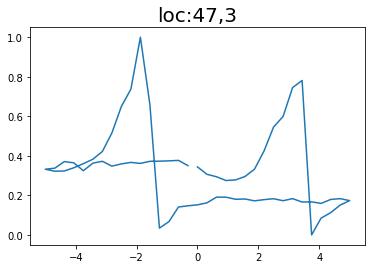

step:  29
Sample #39




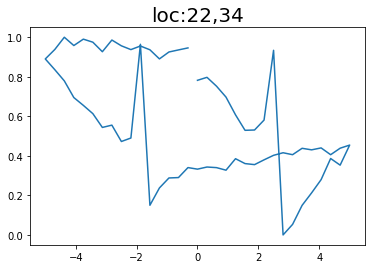

step:  30
Sample #40




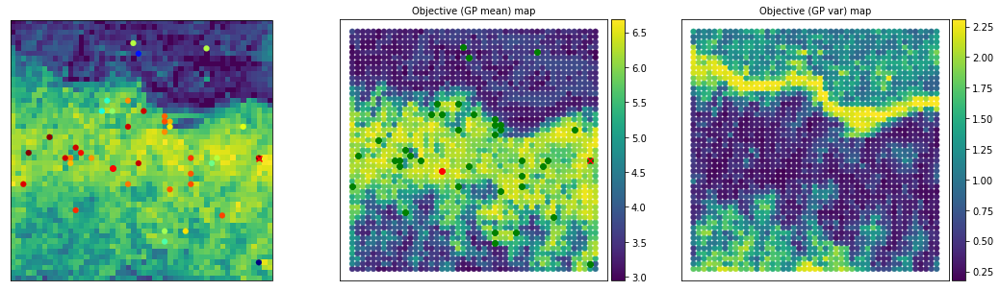

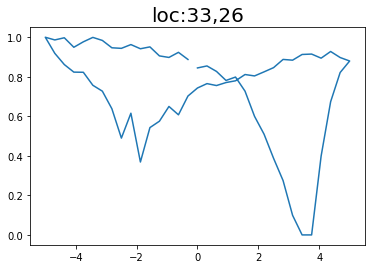

step:  31
Sample #41




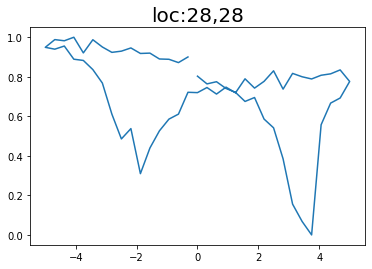

step:  32
Sample #42




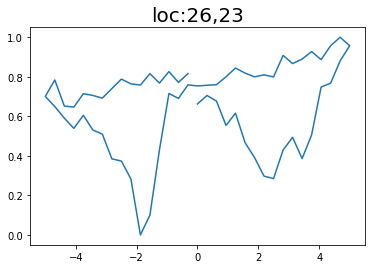

step:  33
Sample #43




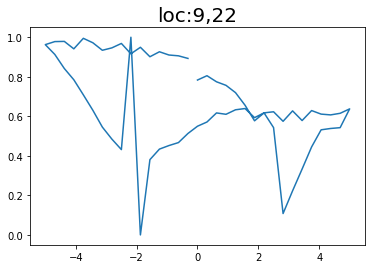

step:  34
Sample #44




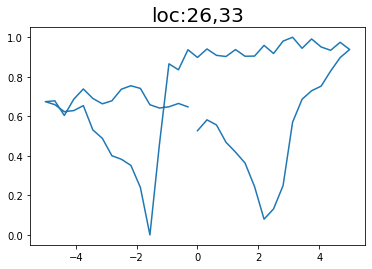

step:  35
Sample #45




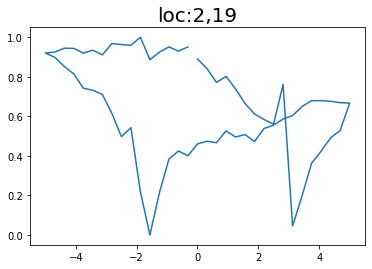

step:  36
Sample #46




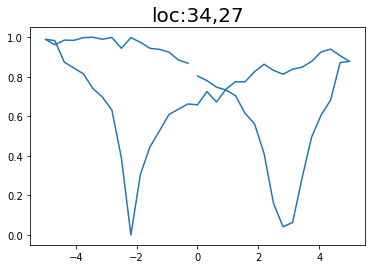

step:  37
Sample #47




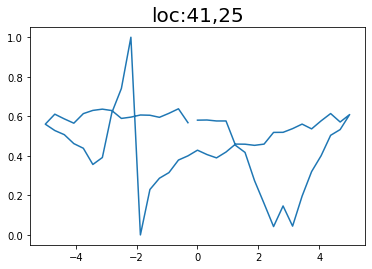

step:  38
Sample #48




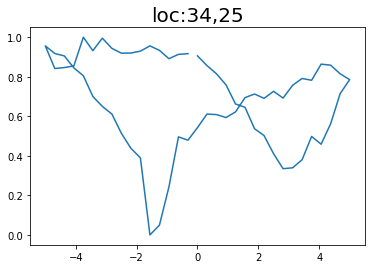

step:  39
Sample #49




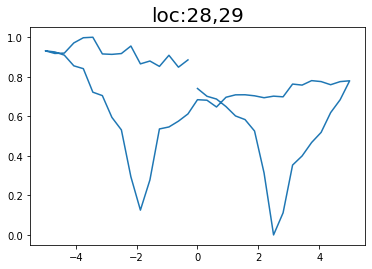

step:  40
Sample #50




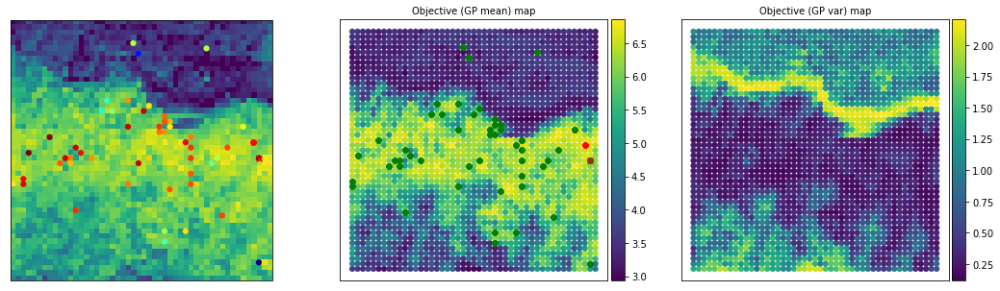

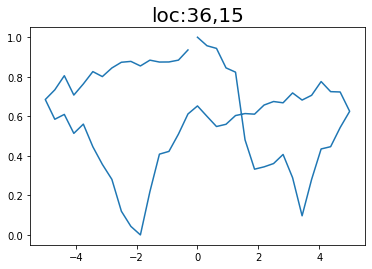

step:  41
Sample #51




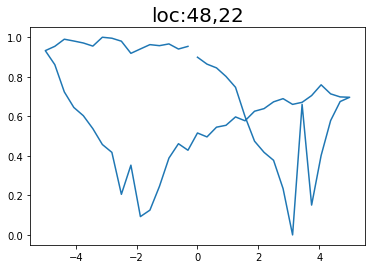

step:  42
Sample #52




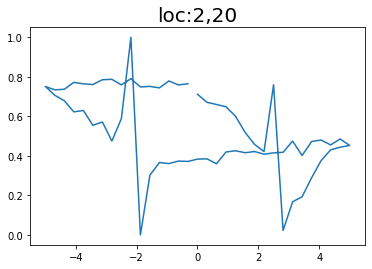

step:  43
Sample #53




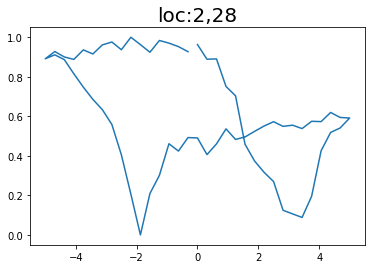

step:  44
Sample #54




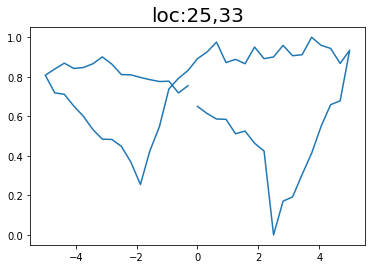

step:  45
Sample #55




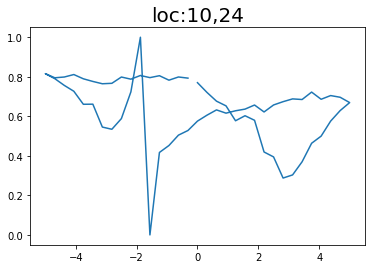

step:  46
Sample #56




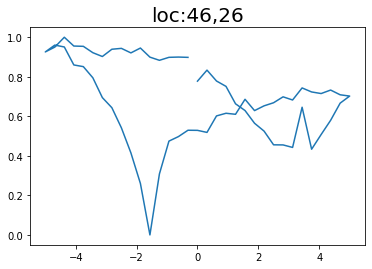

step:  47
Sample #57




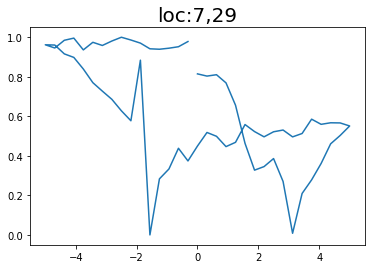

step:  48
Sample #58




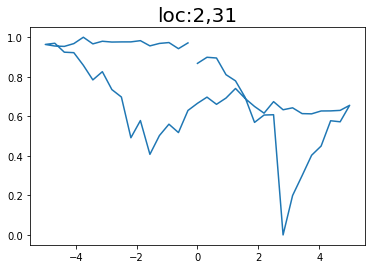

step:  49
Sample #59




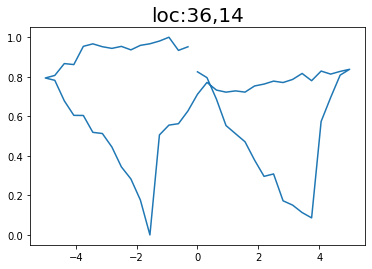

step:  50
Sample #60




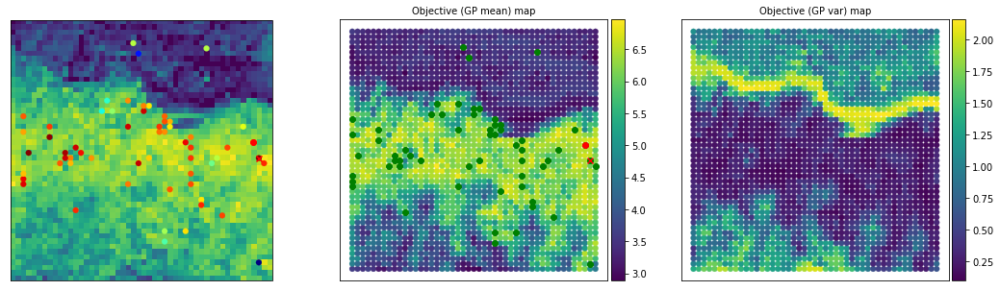

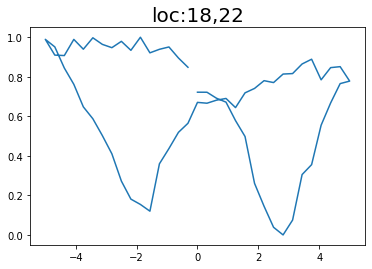

step:  51
Sample #61




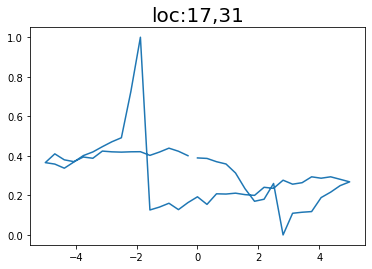

step:  52
Sample #62




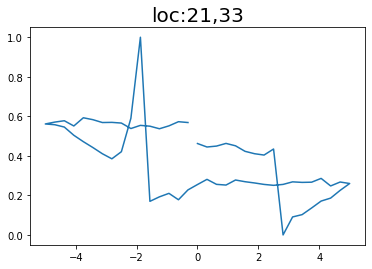

step:  53
Sample #63




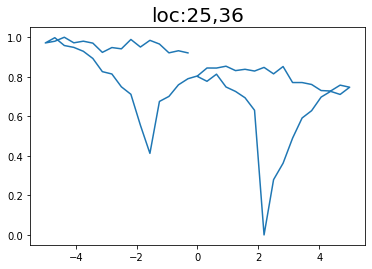

step:  54
Sample #64




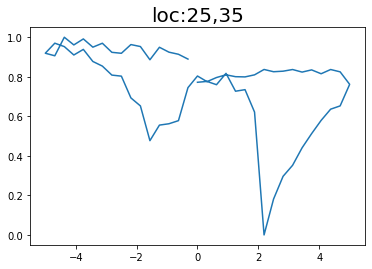

step:  55
Sample #65




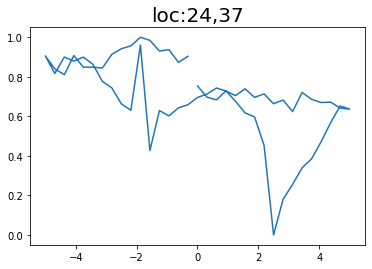

step:  56
Sample #66




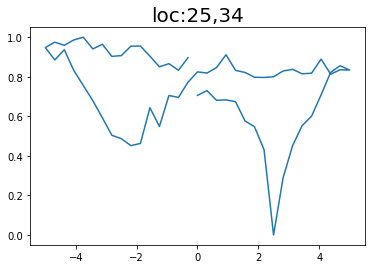

step:  57
Sample #67




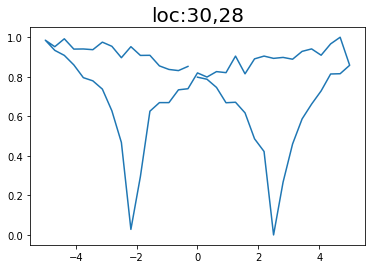

step:  58
Sample #68




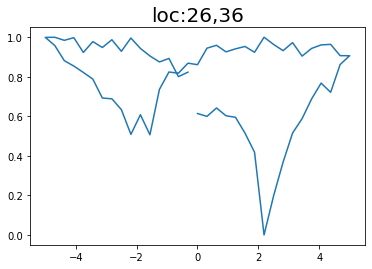

step:  59
Sample #69




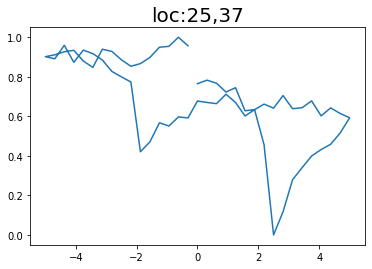

step:  60
Sample #70




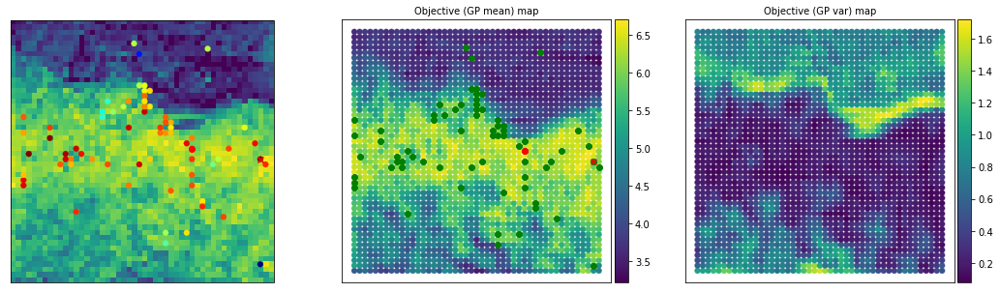

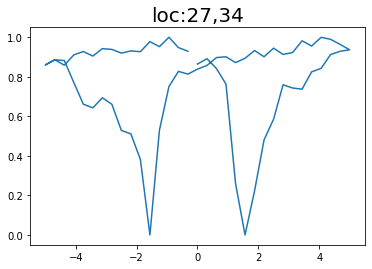

step:  61
Sample #71




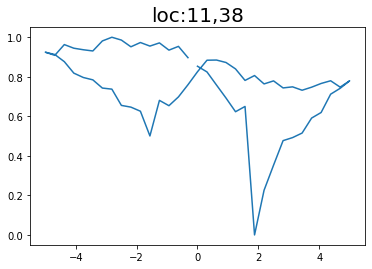

step:  62
Sample #72




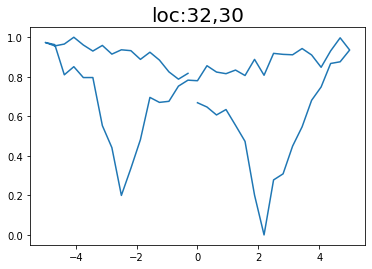

step:  63
Sample #73




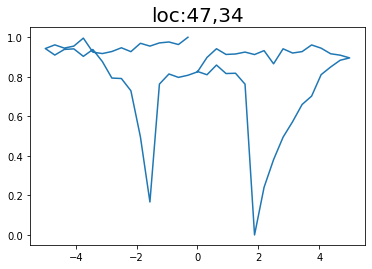

step:  64
Sample #74




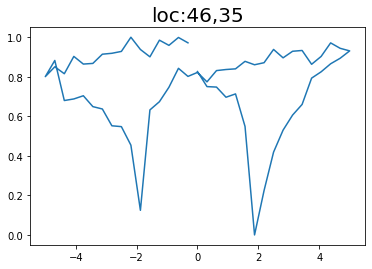

step:  65
Sample #75




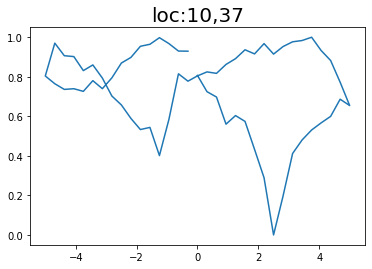

step:  66
Sample #76




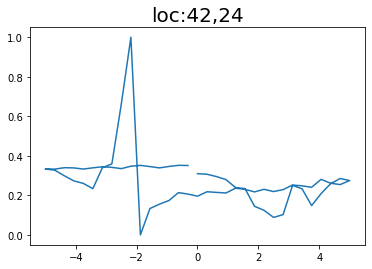

step:  67
Sample #77




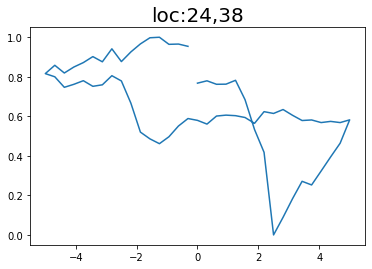

step:  68
Sample #78




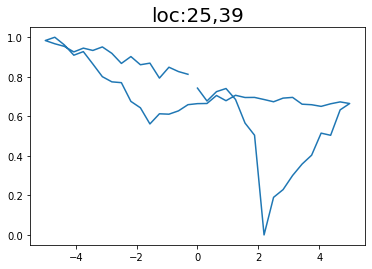

step:  69
Sample #79




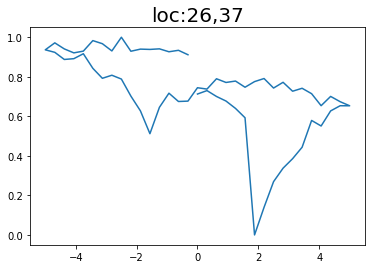

step:  70
Sample #80




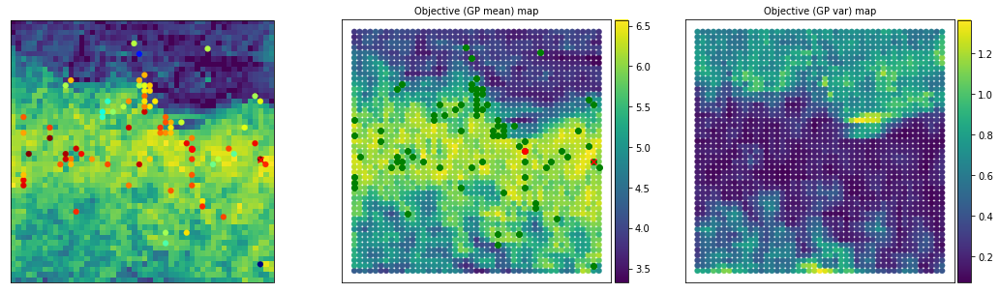

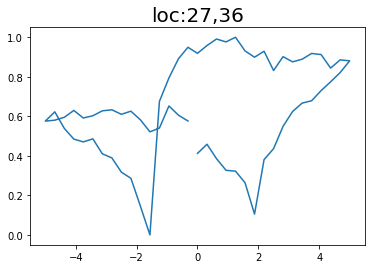

step:  71
Sample #81




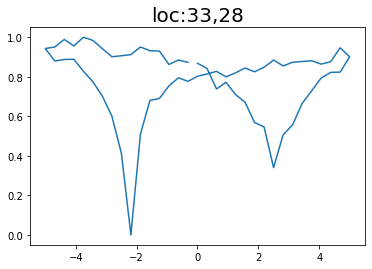

step:  72
Sample #82




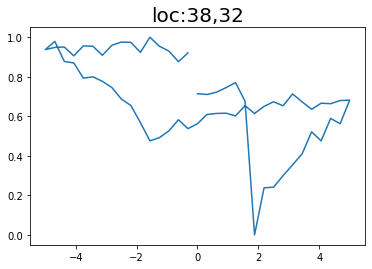

step:  73
Sample #83




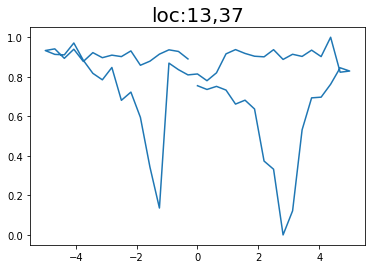

step:  74
Sample #84




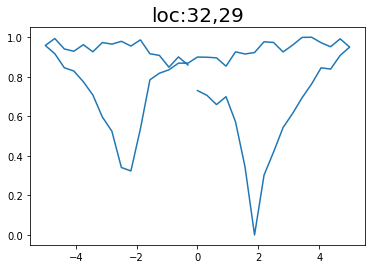

step:  75
Sample #85




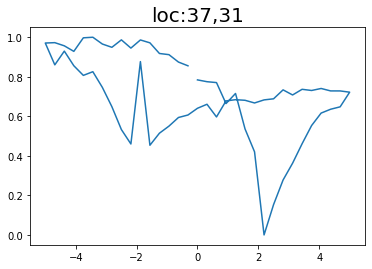

step:  76
Sample #86




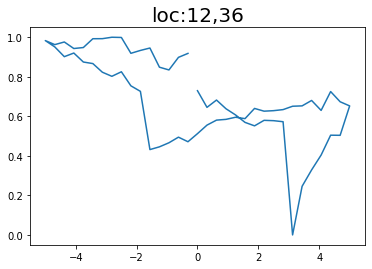

step:  77
Sample #87




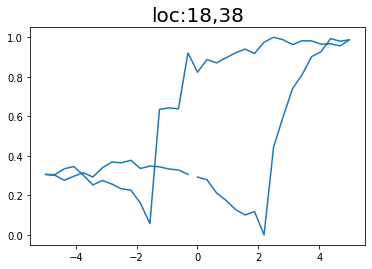

step:  78
Sample #88




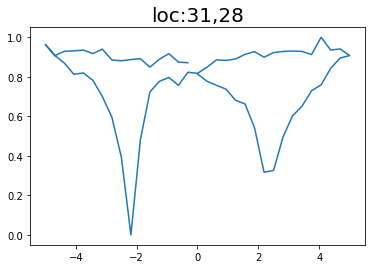

step:  79
Sample #89




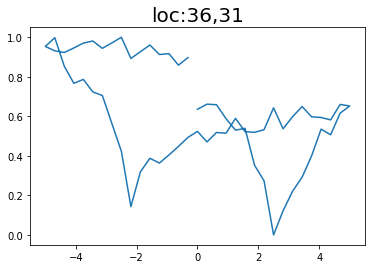

step:  80
Sample #90




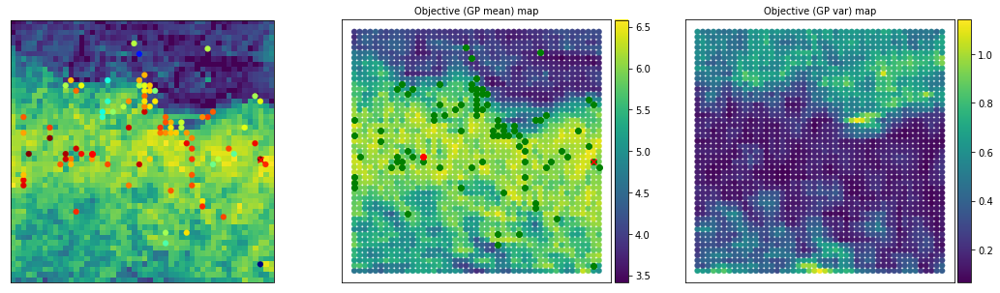

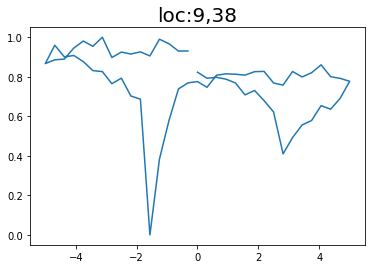

step:  81
Sample #91




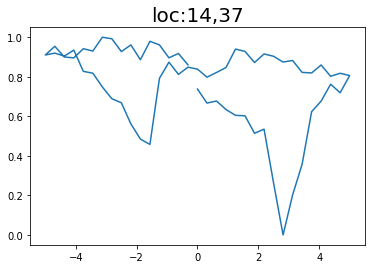

step:  82
Sample #92




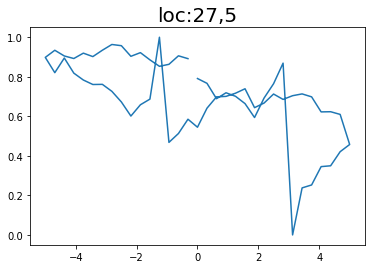

step:  83
Sample #93




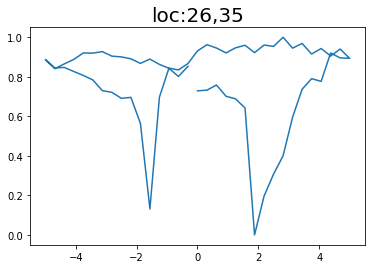

step:  84
Sample #94




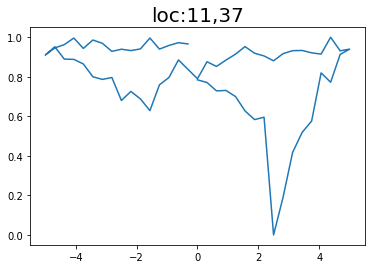

step:  85
Sample #95




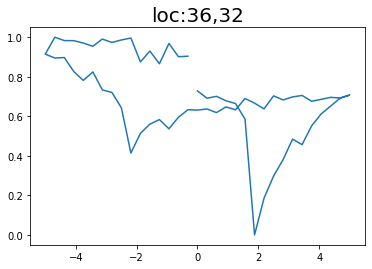

step:  86
Sample #96




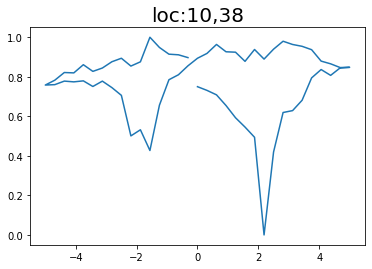

step:  87
Sample #97




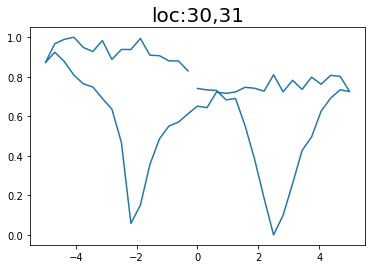

step:  88
Sample #98




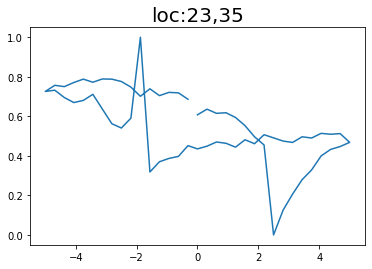

step:  89
Sample #99




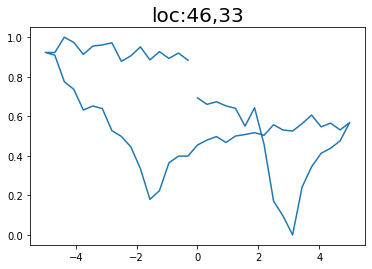

step:  90
Sample #100




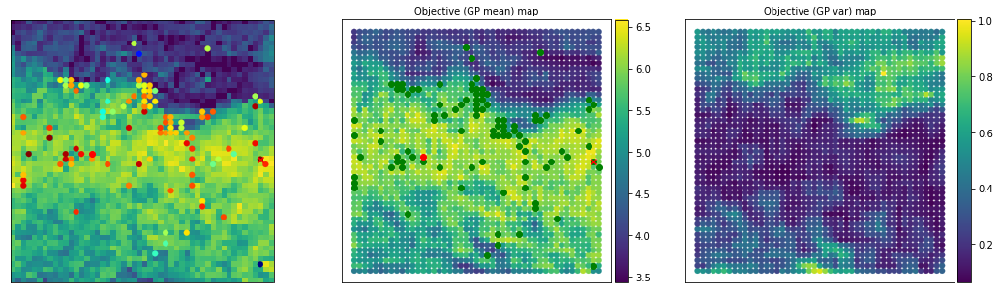

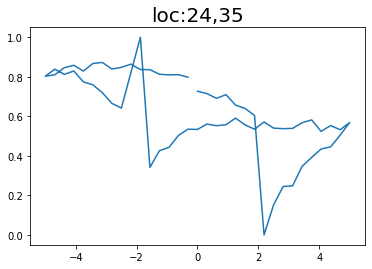

step:  91
Sample #101




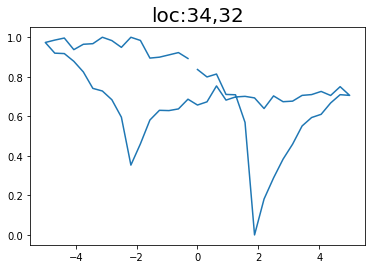

step:  92
Sample #102




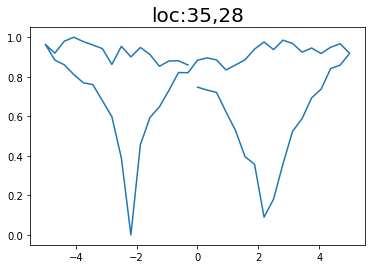

step:  93
Sample #103




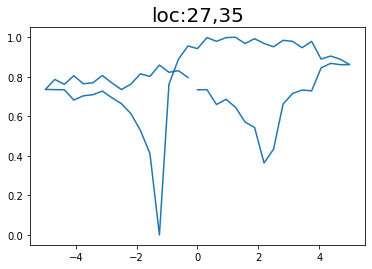

step:  94
Sample #104




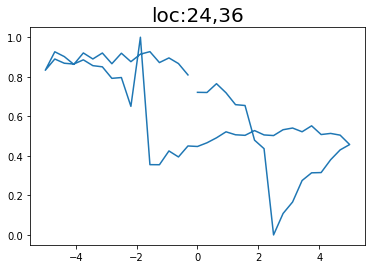

step:  95
Sample #105




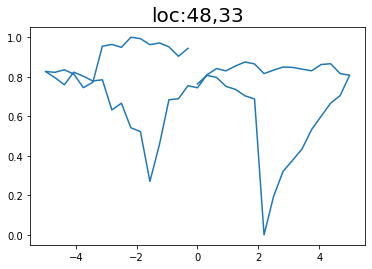

step:  96
Sample #106




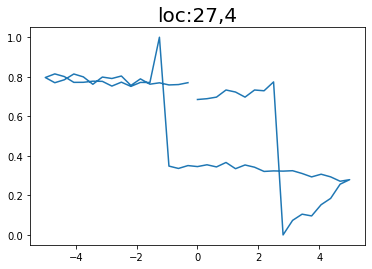

step:  97
Sample #107




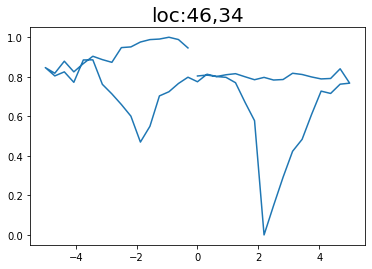

step:  98
Sample #108




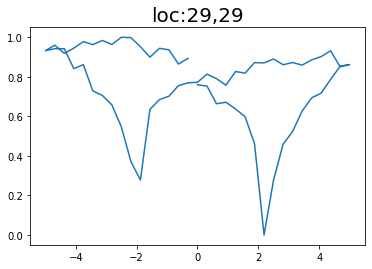

step:  99
Sample #109




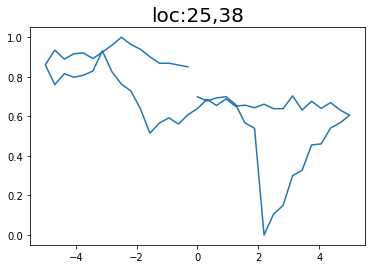

step:  100
Sample #110




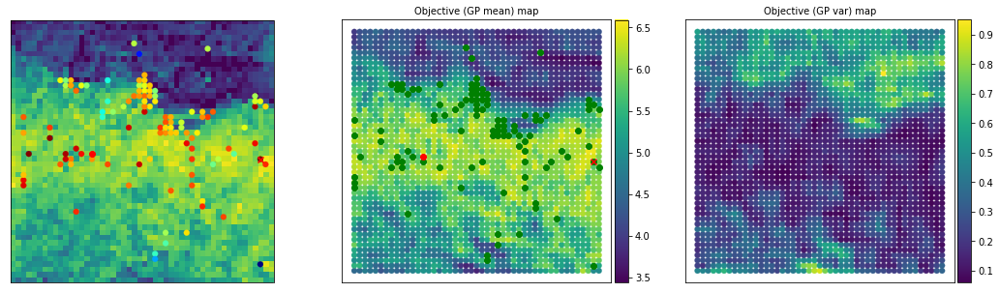

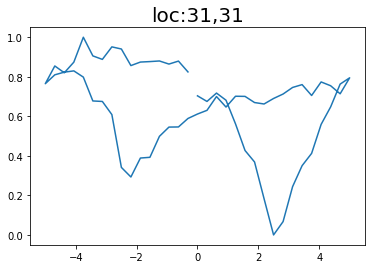



#####----Max. sampling reached, model stopped----#####


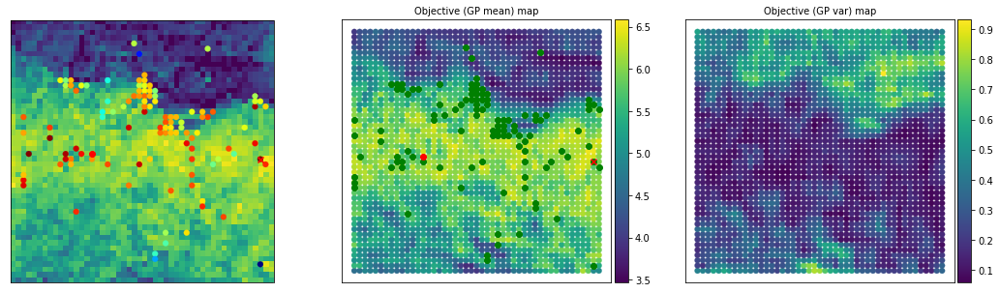

/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  arr = np.asanyarray(arr)
/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [14]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
switch_obj_index = 0 # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
#Set up the surrogat emodel
gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1)+ "\n\n")
    # Calculate posterior for analysis for intermidiate iterations
    y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
    
    #Plot every tenth iteration after running the evaluation
    if ((i == 1) or ((i % 10) == 0)):
        #This will estimate the surrogate
        X_eval, X_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
        #print(X_eval, X_GP)
        fig = plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)
        #put the savefig within the plot function
        #fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #calculate acquisition function
    acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
    val = acq_val
    ind = np.random.choice(acq_cand) # When multiple points have same acq values
    idx = np.hstack((idx, ind))
    #print(new_points_measured, idx)

    ## Find next point which maximizes the learning through exploration-exploitation
    if (i == 1):
        val_ini = val
      # Check for convergence
    if ((val) < 0):  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = torch.empty((1, test_X.shape[1]))
        nextX_norm = torch.empty(1, test_X_norm.shape[1])
        next_indices = torch.empty((1,2))
        nextX[0,:] = test_X[ind, :]
        nextX_norm [0, :] = test_X_norm[ind, :]
        next_indices[0, :] = indices[ind, :]
        idx_x = int(next_indices[0, 0])
        idx_y = int(next_indices[0, 1])

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx
        
        #polarization loop area
        IV, points_measured = return_new_measurement(targets, new_points_measured)

        new_iv = IV[points_measured,:]

        new_spec_x = torch.from_numpy(vdc_vec)
        new_spec_y = torch.from_numpy(new_iv)[-1]

      
        new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
        
        #clear_output(wait=True) Comment out as I need to check the run in colab
        
        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_indices, train_Y, var_params, switch_obj_index, m =\
        play_varTBO.augment_newdata_KL(nextX, nextX_norm, next_indices, train_X, train_X_norm, train_indices, train_Y,
                                        new_spec_x, new_spec_y, eval_spec_y, img, var_params, switch_obj_index, m)


        #print(next_indices)
        # Gp model fit
        # Updating GP with augmented training data
        gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)
# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_indices, train_indices, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data]

#Save few data
np.save("optim_results", optim_results)

# Classification

Text(0.5, 1.0, 'Image classification')

<Figure size 432x288 with 0 Axes>

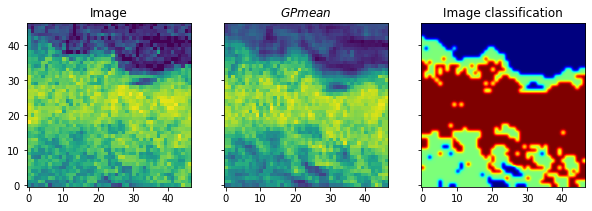

In [17]:
z1_org = final_GP_estim[0]
d1 = int(z1_org.shape[0]**(1/2))
d2 = d1
z1_org = z1_org.reshape(d1,d2)
z1_org = (z1_org-torch.min(z1_org))/(torch.max(z1_org)-torch.min(z1_org))

#Denoising the image using bilateral filter

z1 = denoise_bilateral(z1_org.detach().numpy(), sigma_color=0.05, sigma_spatial=5)


#Determining threshold from otsu algo to separate between foreground and background images
val1 = filters.threshold_multiotsu(z1, classes = 3)
emag_z1 = np.digitize(z1, bins=val1)

plt.figure()
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 15), sharex=True, sharey=True)

ax[0].imshow(img, origin = "lower")
ax[0].set_title("Image")
ax[1].imshow(z1_org, origin="lower", cmap="viridis")
ax[1].set_title("$GP mean$")
ax[2].imshow(emag_z1, origin="lower", cmap="jet", interpolation ="gaussian")
ax[2].set_title("Image classification")

